# **Tétouan City Energy Consumption Dataset**

## **Overview**
Tétouan is a city in northern Morocco, covering an area of approximately **10,375 km²** with a population of **550,374** (2014 Census). 
The city's population is growing at an annual rate of **1.96%**. 
Due to its location along the **Mediterranean Sea**, Tétouan experiences **mild and rainy winters** and **hot, dry summers**.

Morocco's per capita energy consumption stands at **0.56 toe** (42% below the North Africa average), including **900 kWh of electricity** (38% below the regional average) as of **2020**.
Between **2010 and 2019**, total energy consumption grew at **3% per year**, but it declined by **7% in 2020** (to **21 Mtoe**) due to the COVID-19 pandemic.

Since Morocco has **low hydrocarbon production**, it imports **all oil products** following the shutdown of its **only refinery in 2015** (200,000 bbl/d capacity). 
Oil product imports rose by **6% annually (2015-2019)** but fell by **12% in 2020** due to the pandemic.

## **Electricity Distribution in Tétouan**
The **power consumption data** comes from the **Supervisory Control and Data Acquisition (SCADA) System** of **Amendis**, a public service operator responsible for **electricity and water distribution** in Tétouan since **2002**. 

The electricity distribution network delivers power from the **National Office of Electricity and Drinking Water**, transforming **high voltage (63 kV) to medium voltage (20 kV)** before distribution to consumers. The network is divided into **three zone stations**:

- **Quads**
- **Smir**
- **Boussafou**

## **Dataset Description**
This dataset contains **52,416 observations**, recorded at **10-minute intervals**, representing energy consumption in Tétouan.

### **Columns**
| Column Name               | Description |
|---------------------------|-------------|
| **Datetime**              | Time window (10-minute interval) |
| **Temperature**           | Weather temperature (°C) |
| **Humidity**              | Weather humidity (%) |
| **Wind Speed**            | Wind speed (m/s) |
| **General Diffuse Flows** | Low-temperature fluid discharges |
| **Diffuse Flows**         | Additional diffuse energy flows |
| **Zone 1 Power Consumption** | Power consumption in Zone 1 (kW) |
| **Zone 2 Power Consumption** | Power consumption in Zone 2 (kW) |
| **Zone 3 Power Consumption** | Power consumption in Zone 3 (kW) |

This dataset provides an **exhaustive view** of Tétouan's energy consumption, making it useful for **analyzing power demand trends, forecasting electricity usage, and studying environmental impacts**.


## Understanding "General Diffuse Flows" and "Diffuse Flows" 

**1. General Diffuse Flows**
**Definition**: "Diffuse flow" refers to low-temperature (<0.2°C to ~100°C) fluid movement through surfaces like sulfide mounds, fractured lava flows, or biological assemblages.
In meteorology and energy studies, General Diffuse Flows likely measure the scattered solar radiation received at the Earth's surface due to clouds, atmospheric particles, and gas molecules.

**Impact**: This is crucial in understanding how much sunlight indirectly contributes to heating and energy distribution, which in turn can affect power demand (e.g., air conditioning, heating, and overall electricity consumption).

**2. Diffuse Flows**
**Definition**: A more specific type of "diffuse radiation" that represents the fraction of sunlight scattered by the atmosphere and clouds, as opposed to direct sunlight that reaches the surface without obstruction.
It likely quantifies the amount of diffused solar energy available for heating or renewable energy production.

**Impact**: This affects power usage because higher diffuse radiation can reduce direct solar heating, leading to increased heating demand in colder months or stabilizing temperatures in warmer months.

## Data Loading and Priliminary Inspection of the Data

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split


In [2]:
# Load the CSV file
df = pd.read_csv('powerconsumption.csv')

# Display the first 5 rows of the dataframe
df.head()

,Datetime,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3
0,1/1/2017 0:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386
1,1/1/2017 0:10,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434
2,1/1/2017 0:20,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373
3,1/1/2017 0:30,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711
4,1/1/2017 0:40,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964


In [3]:
# Display the statistics of the dataframe
df.describe()


,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,182.696614,75.028022,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,264.400960,124.210949,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,0.004000,0.011000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,0.062000,0.122000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,5.035500,4.456000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,319.600000,101.000000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,1163.000000,936.000000,52204.395120,37408.860760,47598.326360


In [4]:
# The shape of the dataframe
df.shape

(52416, 9)

In [5]:
# Check the variable types in th dataframe
df.dtypes

Datetime                   object
Temperature               float64
Humidity                  float64
WindSpeed                 float64
GeneralDiffuseFlows       float64
DiffuseFlows              float64
PowerConsumption_Zone1    float64
PowerConsumption_Zone2    float64
PowerConsumption_Zone3    float64
dtype: object

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52416 entries, 0 to 52415
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Datetime                52416 non-null  object 
 1   Temperature             52416 non-null  float64
 2   Humidity                52416 non-null  float64
 3   WindSpeed               52416 non-null  float64
 4   GeneralDiffuseFlows     52416 non-null  float64
 5   DiffuseFlows            52416 non-null  float64
 6   PowerConsumption_Zone1  52416 non-null  float64
 7   PowerConsumption_Zone2  52416 non-null  float64
 8   PowerConsumption_Zone3  52416 non-null  float64
dtypes: float64(8), object(1)
memory usage: 3.6+ MB


In [7]:
# Check for missing values
df.isnull().sum()

Datetime                  0
Temperature               0
Humidity                  0
WindSpeed                 0
GeneralDiffuseFlows       0
DiffuseFlows              0
PowerConsumption_Zone1    0
PowerConsumption_Zone2    0
PowerConsumption_Zone3    0
dtype: int64

There are no missing values in the dataframe

In [8]:
# Check for duplicates
df.duplicated().sum()

0

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52416 entries, 0 to 52415
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Datetime                52416 non-null  object 
 1   Temperature             52416 non-null  float64
 2   Humidity                52416 non-null  float64
 3   WindSpeed               52416 non-null  float64
 4   GeneralDiffuseFlows     52416 non-null  float64
 5   DiffuseFlows            52416 non-null  float64
 6   PowerConsumption_Zone1  52416 non-null  float64
 7   PowerConsumption_Zone2  52416 non-null  float64
 8   PowerConsumption_Zone3  52416 non-null  float64
dtypes: float64(8), object(1)
memory usage: 3.6+ MB


## Data Wrangling

In [96]:
# Change the datatype of the Date column to datetime
df['Datetime'] = pd.to_datetime(df['Datetime'])

# Extract the year, month, day, hour from the Datetime column
df['Year'] = df['Datetime'].dt.year
df['Month'] = df['Datetime'].dt.month
df['Day'] = df['Datetime'].dt.day
df['Dayofweek'] = df['Datetime'].dt.dayofweek  # 0=Monday, 6=Sunday
df['Time'] = df['Datetime'].dt.time
df['Quarter'] = df['Datetime'].dt.quarter

# Weekend is Saturday (5) and Sunday (6)
df['Is_weekend'] = np.where(df['Dayofweek'].isin([5,6]), 1, 0)

# Working days are Monday (0) through Friday (4)
df['Is_working_day'] = np.where(df['Dayofweek'].isin([0,1,2,3,4]), 1, 0)

# Working hours are 9:00-17:00 (9 AM - 5 PM)
df['Is_working_hour'] = np.where(df['Datetime'].dt.hour.between(9,17), 1, 0)

# Get week number (0-53)
df['week_of_year'] = df['Datetime'].dt.strftime('%U').astype(int)


In [11]:
# Check the timeframe of the data
print('Start Date: ', df['Datetime'].min())
print('End Date: ', df['Datetime'].max())

Start Date:  2017-01-01 00:00:00
End Date:  2017-12-30 23:50:00


In [12]:
df.head()

,Datetime,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3,Year,Month,Day,Dayofweek,Time,Quarter,Is_weekend,Is_working_day,Is_working_hour,week_of_year
0,2017-01-01 00:00:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386,2017,1,1,6,00:00:00,1,1,0,0,1
1,2017-01-01 00:10:00,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434,2017,1,1,6,00:10:00,1,1,0,0,1
2,2017-01-01 00:20:00,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373,2017,1,1,6,00:20:00,1,1,0,0,1
3,2017-01-01 00:30:00,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711,2017,1,1,6,00:30:00,1,1,0,0,1
4,2017-01-01 00:40:00,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964,2017,1,1,6,00:40:00,1,1,0,0,1


We can see that the data that we have is for a time period of 12 months in the year of 2017.

In [13]:
df['Month'].value_counts()

Month
1     4464
3     4464
5     4464
7     4464
8     4464
10    4464
4     4320
6     4320
9     4320
11    4320
12    4320
2     4032
Name: count, dtype: int64

In [14]:
df['Day'].value_counts()

Day
1     1728
2     1728
28    1728
27    1728
26    1728
25    1728
24    1728
23    1728
22    1728
21    1728
20    1728
19    1728
18    1728
17    1728
16    1728
15    1728
14    1728
13    1728
12    1728
11    1728
10    1728
9     1728
8     1728
7     1728
6     1728
5     1728
4     1728
3     1728
29    1584
30    1584
31     864
Name: count, dtype: int64

### Create a new column which states if it a morrocon holiday or not

In [15]:
# !pip install --upgrade holidays

In [16]:
# We will create a new column called 'Holiday' which will indicate whether a day is a holiday or not in Morroco

import holidays

morocco_holidays = holidays.Morocco()

df['Holiday'] = df['Datetime'].dt.date.map(lambda x: 1 if x in morocco_holidays else 0)

df['Holiday'].value_counts()

df.head()

,Datetime,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3,Year,Month,Day,Dayofweek,Time,Quarter,Is_weekend,Is_working_day,Is_working_hour,week_of_year,Holiday
0,2017-01-01 00:00:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386,2017,1,1,6,00:00:00,1,1,0,0,1,1
1,2017-01-01 00:10:00,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434,2017,1,1,6,00:10:00,1,1,0,0,1,1
2,2017-01-01 00:20:00,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373,2017,1,1,6,00:20:00,1,1,0,0,1,1
3,2017-01-01 00:30:00,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711,2017,1,1,6,00:30:00,1,1,0,0,1,1
4,2017-01-01 00:40:00,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964,2017,1,1,6,00:40:00,1,1,0,0,1,1


In [17]:
df['Quarter'] = df['Quarter'].replace({1: 'Q1', 2: 'Q2', 3: 'Q3', 4: 'Q4'})
df.head()

,Datetime,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3,Year,Month,Day,Dayofweek,Time,Quarter,Is_weekend,Is_working_day,Is_working_hour,week_of_year,Holiday
0,2017-01-01 00:00:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386,2017,1,1,6,00:00:00,Q1,1,0,0,1,1
1,2017-01-01 00:10:00,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434,2017,1,1,6,00:10:00,Q1,1,0,0,1,1
2,2017-01-01 00:20:00,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373,2017,1,1,6,00:20:00,Q1,1,0,0,1,1
3,2017-01-01 00:30:00,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711,2017,1,1,6,00:30:00,Q1,1,0,0,1,1
4,2017-01-01 00:40:00,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964,2017,1,1,6,00:40:00,Q1,1,0,0,1,1


## Exploratory Data Analysis

In [18]:
df.columns

Index(['Datetime', 'Temperature', 'Humidity', 'WindSpeed',
       'GeneralDiffuseFlows', 'DiffuseFlows', 'PowerConsumption_Zone1',
       'PowerConsumption_Zone2', 'PowerConsumption_Zone3', 'Year', 'Month',
       'Day', 'Dayofweek', 'Time', 'Quarter', 'Is_weekend', 'Is_working_day',
       'Is_working_hour', 'week_of_year', 'Holiday'],
      dtype='object')

### Zone 1 Analysis

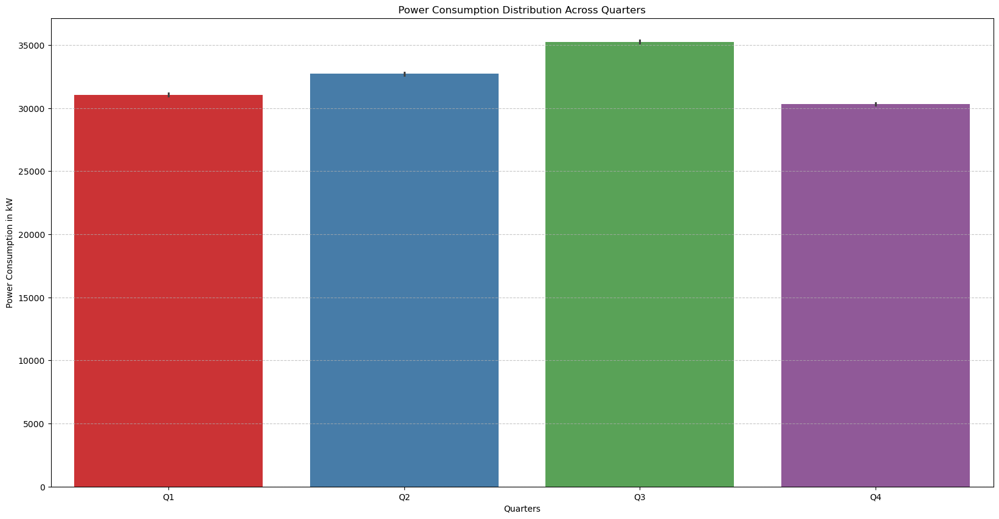

<Figure size 640x480 with 0 Axes>

In [19]:
# Power Consumption Distribution Across Quarters

plt.figure(figsize=(20, 10))
sns.barplot(x='Quarter', y='PowerConsumption_Zone1', data=df, hue='Quarter', palette='Set1')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Quarters')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Quarters')
plt.show()
plt.tight_layout()

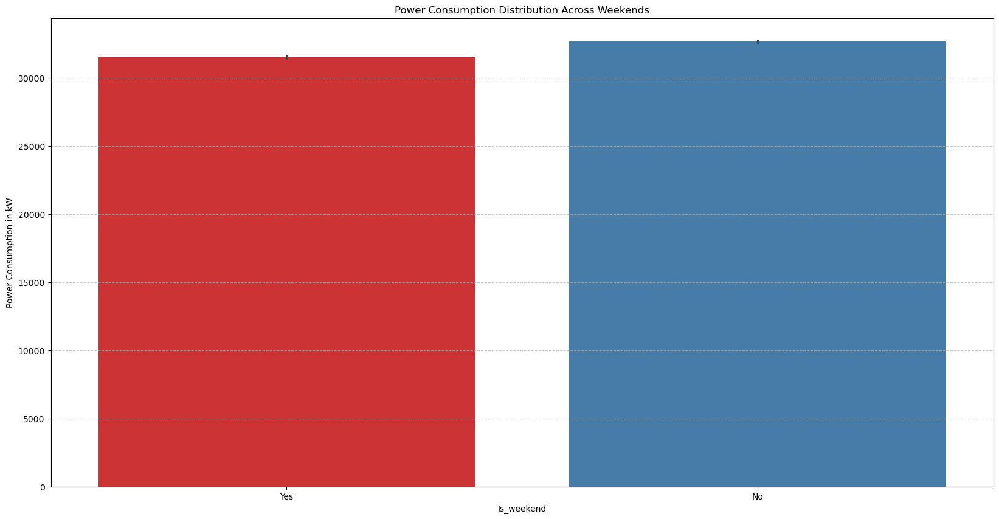

In [20]:
plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x=df['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),  # Correct apply usage
            y='PowerConsumption_Zone1', data=df, hue=df['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'), palette='Set1')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Weekends')
plt.show()

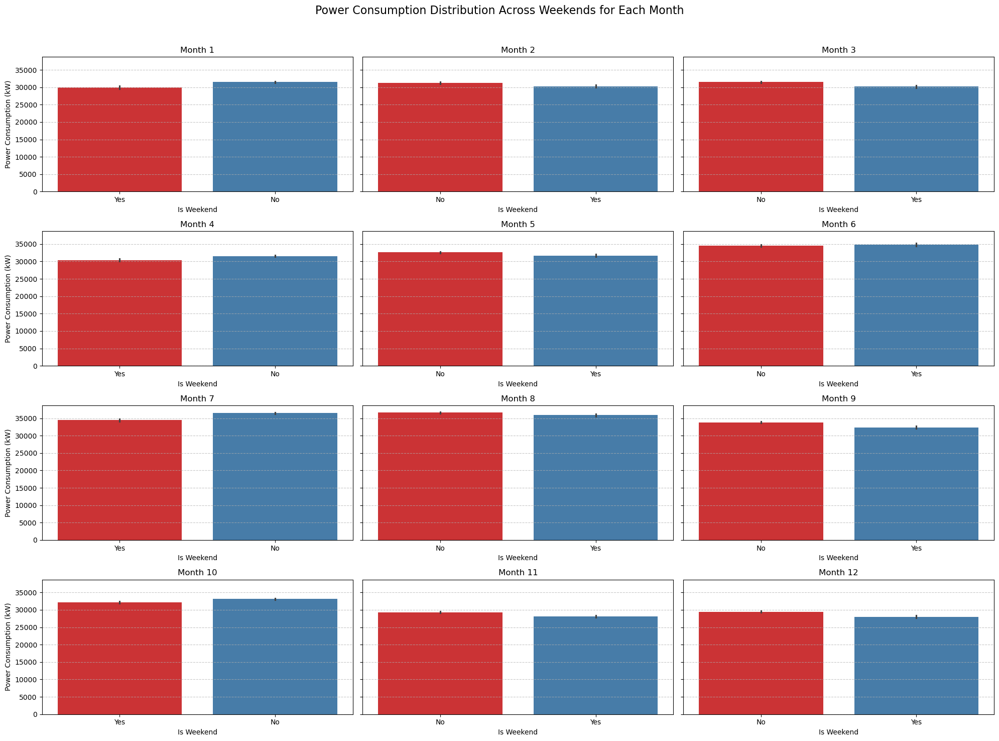

In [21]:
# Create a figure with subplots (3 rows, 4 columns for 12 months)
fig, axes = plt.subplots(4, 3, figsize=(20, 15), sharey=True)  # 3x3 grid for 12 months
fig.suptitle('Power Consumption Distribution Across Weekends for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(sorted(df['Month'].unique())):
    ax = axes[i // 3, i % 3]  # Get subplot position in 3x4 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart
    sns.barplot(
        x=df_month['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),  
        y=df_month['PowerConsumption_Zone1'], 
        hue=df_month['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),
        palette='Set1', 
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Is Weekend')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

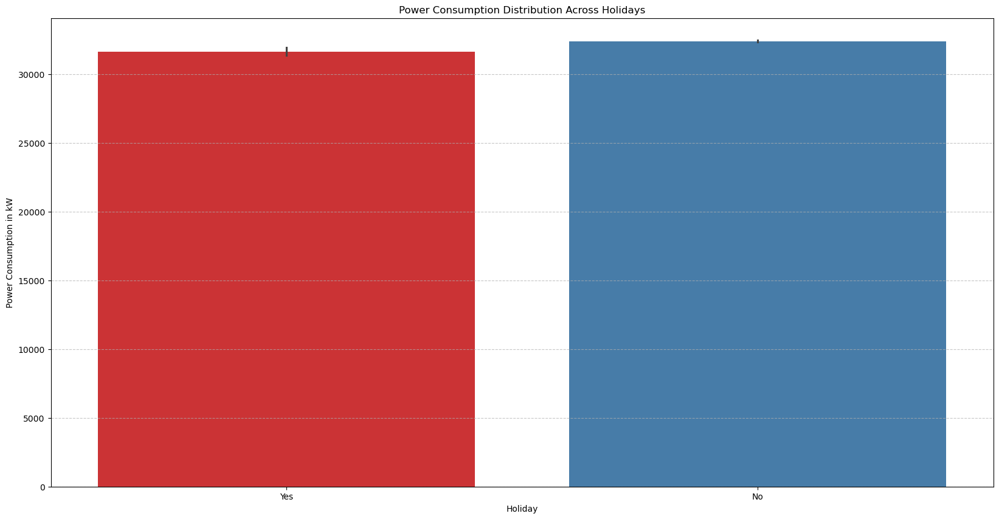

In [22]:

plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x=df['Holiday'].apply(lambda x: 'No' if x==0 else 'Yes'), y='PowerConsumption_Zone1', data=df, hue=df['Holiday'].apply(lambda x: 'No' if x==0 else 'Yes'), palette='Set1')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Holidays')
plt.show()

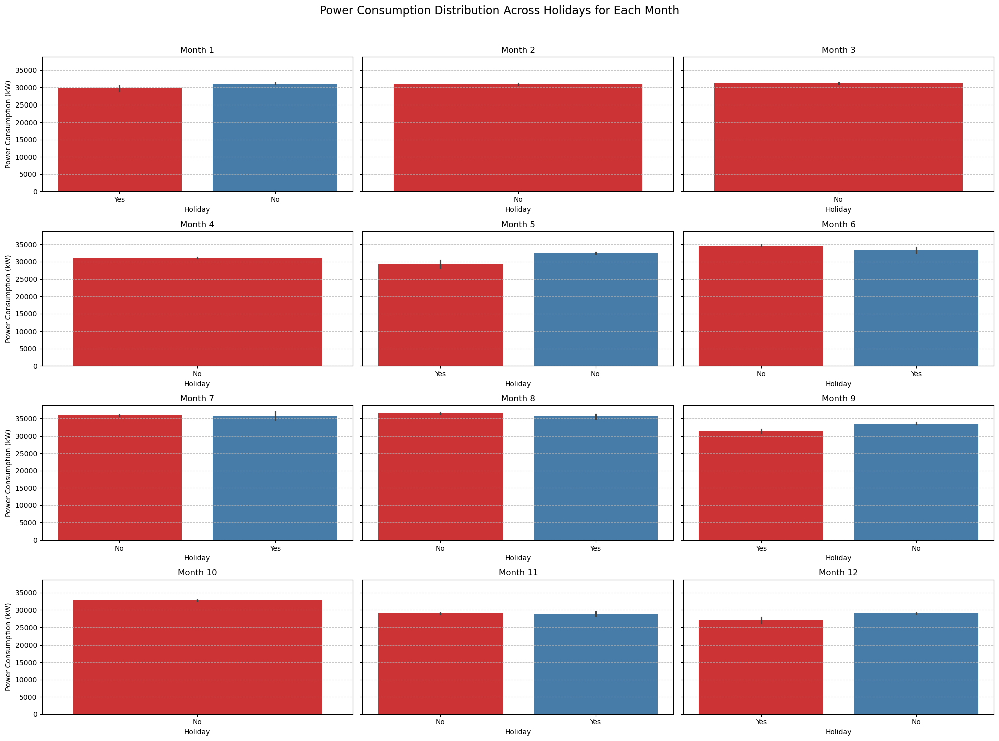

In [23]:
# Create a figure with subplots (3 rows, 4 columns for 12 months)
fig, axes = plt.subplots(4, 3, figsize=(20, 15), sharey=True)  # 3x3 grid for 12 months
fig.suptitle('Power Consumption Distribution Across Holidays for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(sorted(df['Month'].unique())):
    ax = axes[i // 3, i % 3]  # Get subplot position in 3x4 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart
    sns.barplot(
        x=df_month['Holiday'].apply(lambda x: 'No' if x == 0 else 'Yes'),  
        y=df_month['PowerConsumption_Zone1'], 
        hue=df_month['Holiday'].apply(lambda x: 'No' if x == 0 else 'Yes'),
        palette='Set1', 
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Holiday')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

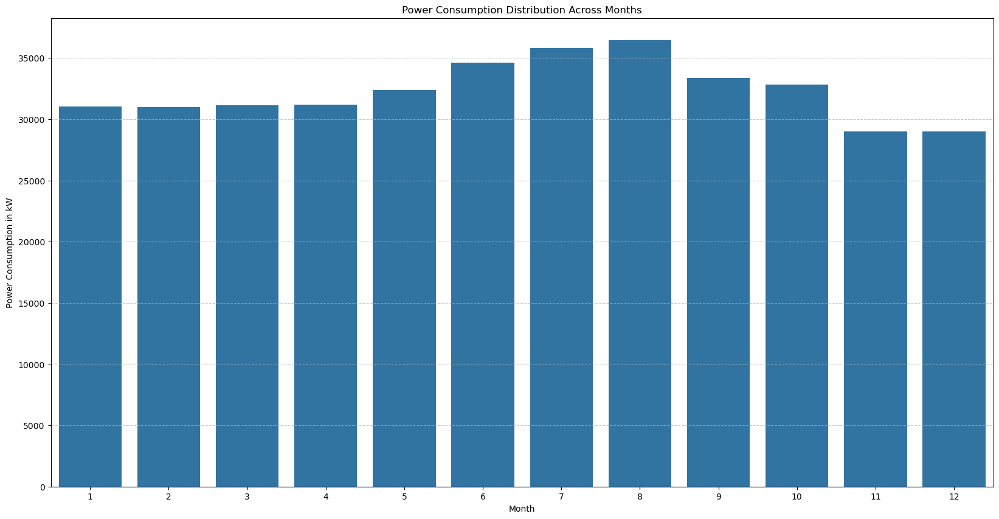

In [24]:
plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x='Month', y='PowerConsumption_Zone1', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Months')
plt.show()

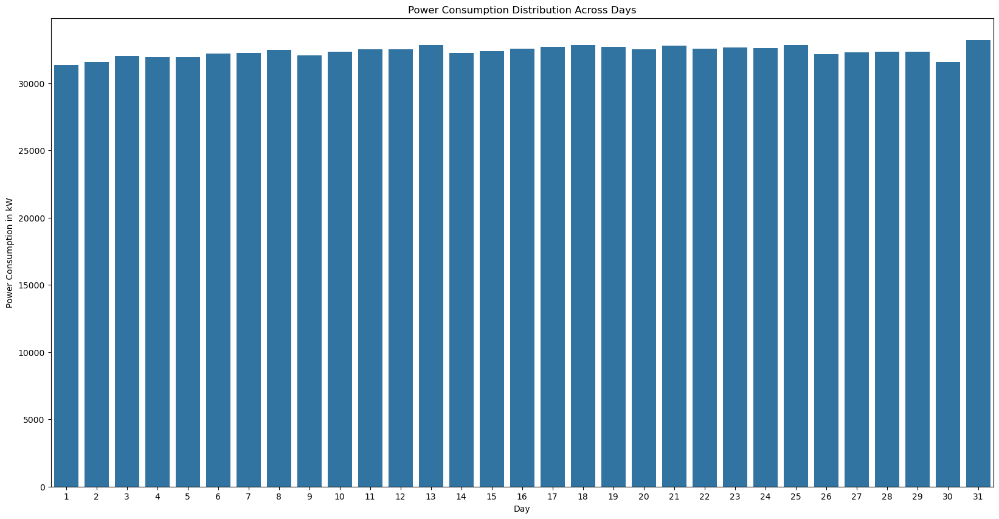

In [25]:
plt.figure(figsize=(20, 10))
sns.barplot(x='Day', y='PowerConsumption_Zone1', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Days')
plt.show()

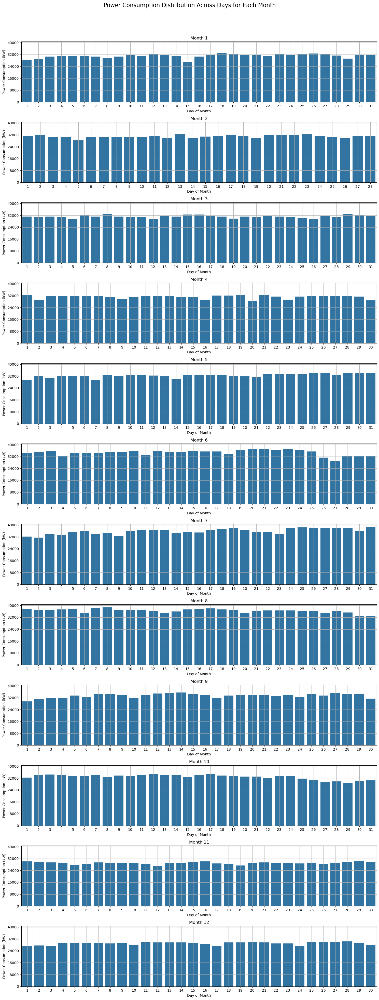

In [26]:
# Create a 12x1 grid for 12 months (12 rows, 1 column)
fig, axes = plt.subplots(12, 1, figsize=(15, 40), sharey=True)
fig.suptitle('Power Consumption Distribution Across Days for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(df['Month'].unique()):  # Loop through all 12 months without sorting
    ax = axes[i]  # Get subplot position in 12x1 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart for power consumption across days
    sns.barplot(
        x='Day', 
        y='PowerConsumption_Zone1', 
        data=df_month, 
        errorbar=None,
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day of Month')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid()

    ax.set_yticks(np.arange(0, 40001, 8000))  # Set y-axis ticks for better readability

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

Text(0.5, 1.0, 'Power Consumption Distribution Across Time')

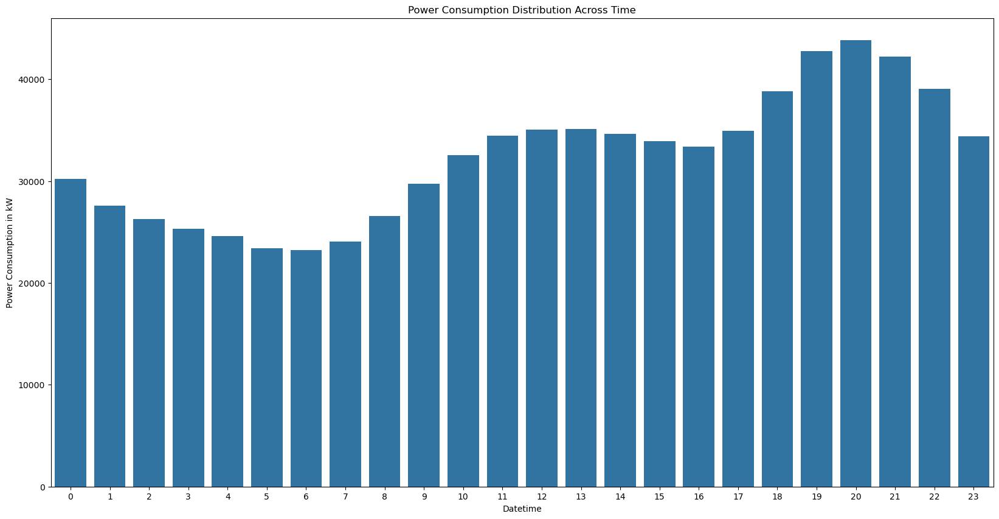

In [27]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['Datetime'].dt.hour, y='PowerConsumption_Zone1', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Time')

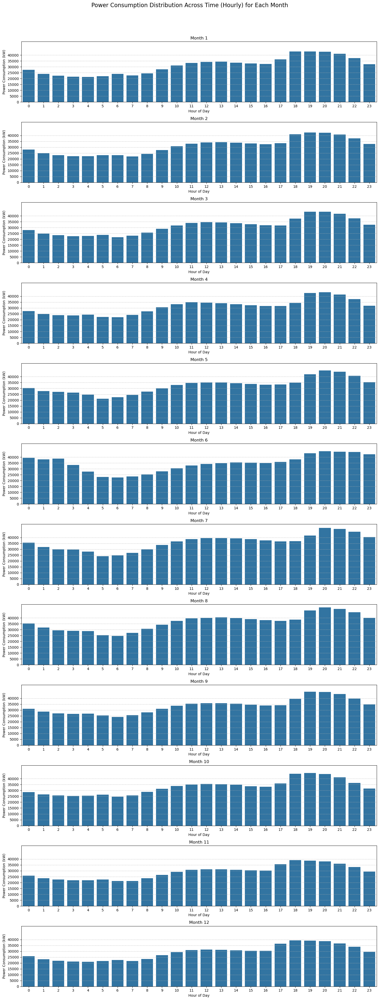

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create a 12x1 grid for 12 months (12 rows, 1 column)
fig, axes = plt.subplots(12, 1, figsize=(15, 40), sharey=True)
fig.suptitle('Power Consumption Distribution Across Time (Hourly) for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(df['Month'].unique()):  # Loop through all 12 months without sorting
    ax = axes[i]  # Get subplot position in 12x1 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart for power consumption across hours of the day
    sns.barplot(
        x=df_month['Datetime'].dt.hour,  # Extract hour from the 'Datetime' column
        y='PowerConsumption_Zone1', 
        data=df_month, 
        errorbar=None,
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Hour of Day')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    ax.set_yticks(np.arange(0, 40001, 5000))  # Set y-axis ticks for better readability

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()


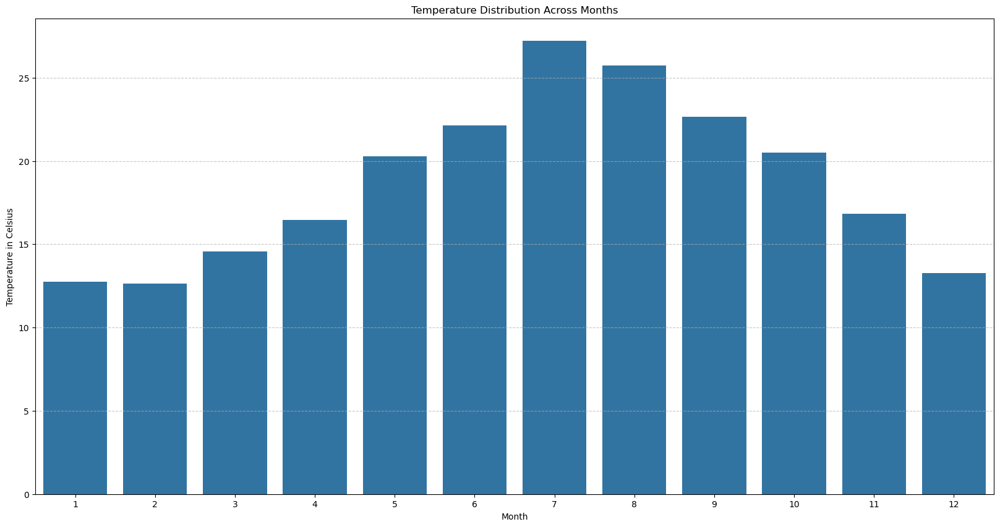

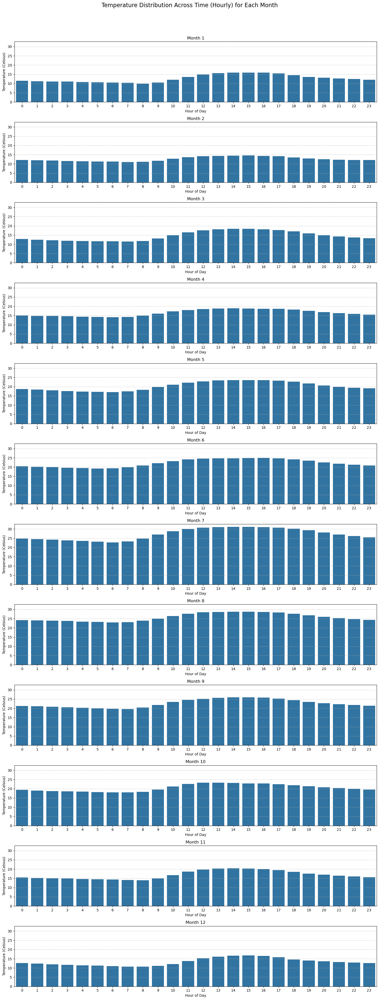

In [29]:
# PLot the temperature distribution for each month
plt.figure(figsize=(20, 10))
sns.barplot(x='Month', y='Temperature', data=df, errorbar=None)
plt.ylabel('Temperature in Celsius')
plt.title('Temperature Distribution Across Months')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Create a 12x1 grid for 12 months (12 rows, 1 column)
fig, axes = plt.subplots(12, 1, figsize=(15, 40), sharey=True)
fig.suptitle('Temperature Distribution Across Time (Hourly) for Each Month', fontsize=16)

# Loop through each month and create a subplot

for i, month in enumerate(df['Month'].unique()):  # Loop through all 12 months without sorting
    ax = axes[i]  # Get subplot position in 12x1 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart for temperature across hours of the day
    sns.barplot(
        x=df_month['Datetime'].dt.hour,  # Extract hour from the 'Datetime' column
        y='Temperature', 
        data=df_month, 
        errorbar=None,
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Hour of Day')
    ax.set_ylabel('Temperature (Celsius)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    ax.set_yticks(np.arange(0, 31, 5))  # Set y-axis ticks for better readability

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()


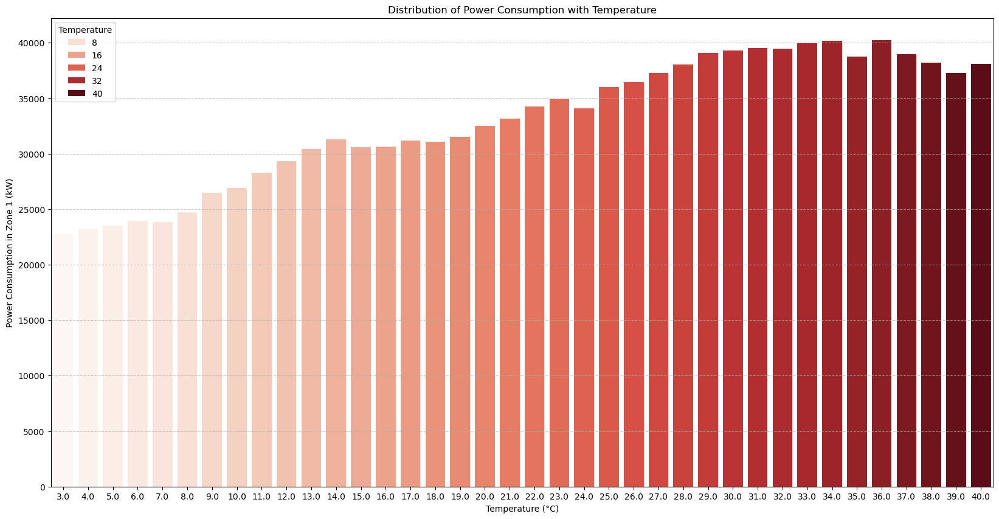

In [30]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['Temperature'].round(0), y='PowerConsumption_Zone1', data=df, errorbar=None, hue=df['Temperature'].round(0), palette='Reds')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Temperature (°C)')
plt.ylabel('Power Consumption in Zone 1 (kW)')
plt.title('Distribution of Power Consumption with Temperature')
plt.show()

In [31]:
df['Temperature'].describe()

count    52416.000000
mean        18.810024
std          5.815476
min          3.247000
25%         14.410000
50%         18.780000
75%         22.890000
max         40.010000
Name: Temperature, dtype: float64

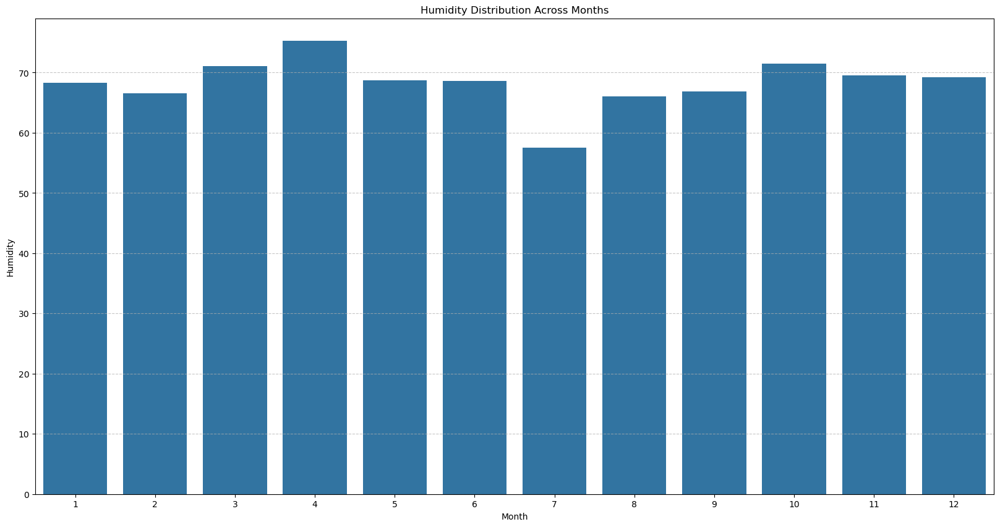

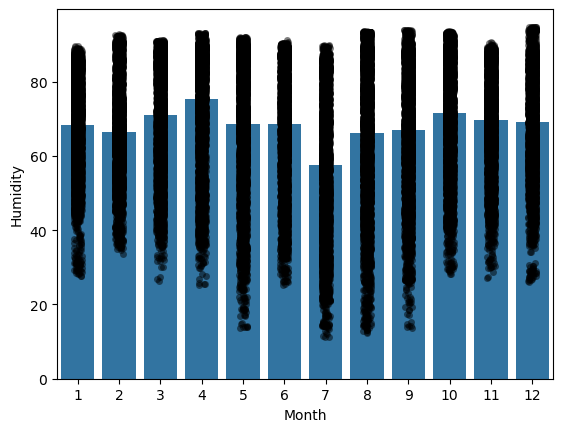

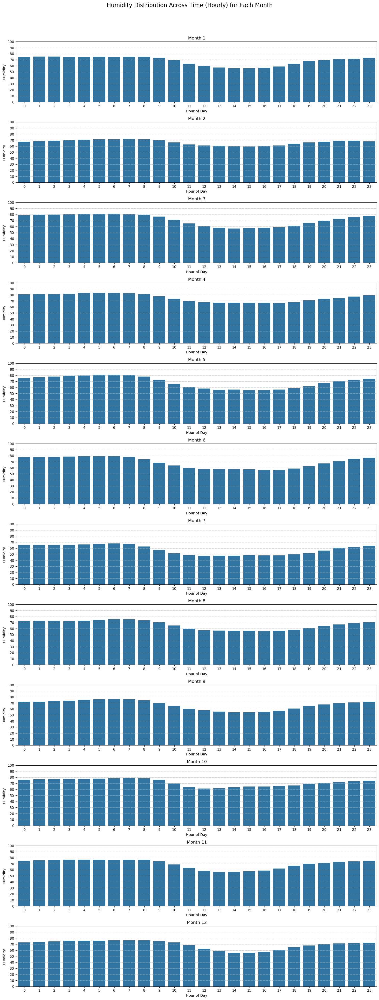

In [32]:
# PLot the temperature distribution for each month
plt.figure(figsize=(20, 10))
sns.barplot(x='Month', y='Humidity', data=df, errorbar=None)
plt.ylabel('Humidity')
plt.title('Humidity Distribution Across Months')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


sns.barplot(x='Month', y='Humidity', data=df, errorbar=None)
sns.stripplot(x='Month', y='Humidity', data=df, color='black', alpha=0.5)


# Create a 12x1 grid for 12 months (12 rows, 1 column)
fig, axes = plt.subplots(12, 1, figsize=(15, 40), sharey=True)
fig.suptitle('Humidity Distribution Across Time (Hourly) for Each Month', fontsize=16)

# Loop through each month and create a subplot

for i, month in enumerate(df['Month'].unique()):  # Loop through all 12 months without sorting
    ax = axes[i]  # Get subplot position in 12x1 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart for temperature across hours of the day
    sns.barplot(
        x=df_month['Datetime'].dt.hour,  # Extract hour from the 'Datetime' column
        y='Humidity', 
        data=df_month, 
        errorbar=None,
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Hour of Day')
    ax.set_ylabel('Humidity')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    ax.set_yticks(np.arange(0, 101, 10))  # Set y-axis ticks for better readability

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()


In [33]:
df['Humidity'].describe()

count    52416.000000
mean        68.259518
std         15.551177
min         11.340000
25%         58.310000
50%         69.860000
75%         81.400000
max         94.800000
Name: Humidity, dtype: float64

C:\Users\anbuv\AppData\Local\Temp\ipykernel_2148\1064064006.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


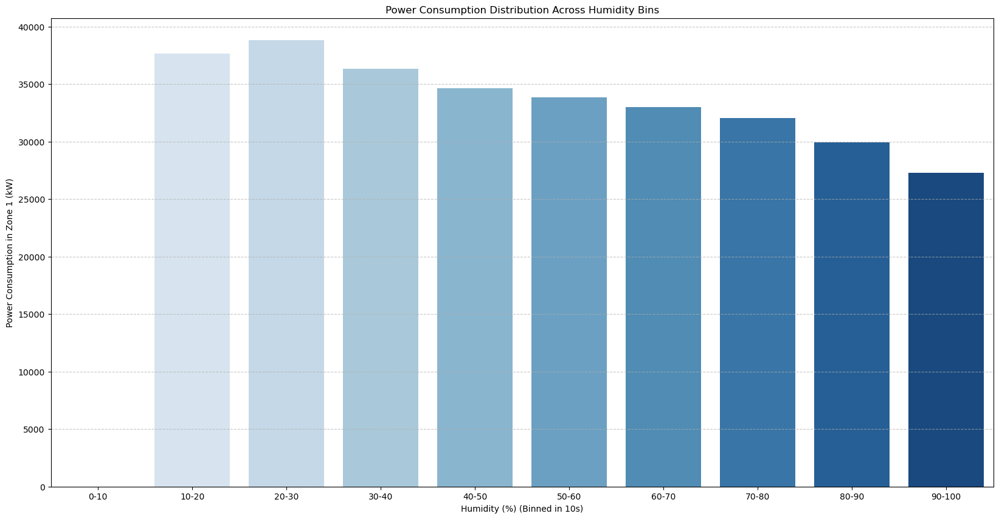

In [34]:
# Define bins (0-10, 10-20, 20-30, 30-40, etc.)
bins = range(0, 101, 10)  # 0 to 100 with step of 10
labels = [f"{b}-{b+10}" for b in bins[:-1]] 

# Create a new column in the dataframe for binned humidity
df['Humidity_Bins'] = pd.cut(df['Humidity'], bins=bins, labels=labels, include_lowest=True)

# Plot the binned humidity values
plt.figure(figsize=(20, 10))
sns.barplot(
    x='Humidity_Bins', 
    y='PowerConsumption_Zone1', 
    data=df, 
    errorbar=None, 
    palette='Blues'
)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Humidity (%) (Binned in 10s)')
plt.ylabel('Power Consumption in Zone 1 (kW)')
plt.title('Power Consumption Distribution Across Humidity Bins')
plt.show()

In [35]:
df['WindSpeed'].describe()

count    52416.000000
mean         1.959489
std          2.348862
min          0.050000
25%          0.078000
50%          0.086000
75%          4.915000
max          6.483000
Name: WindSpeed, dtype: float64

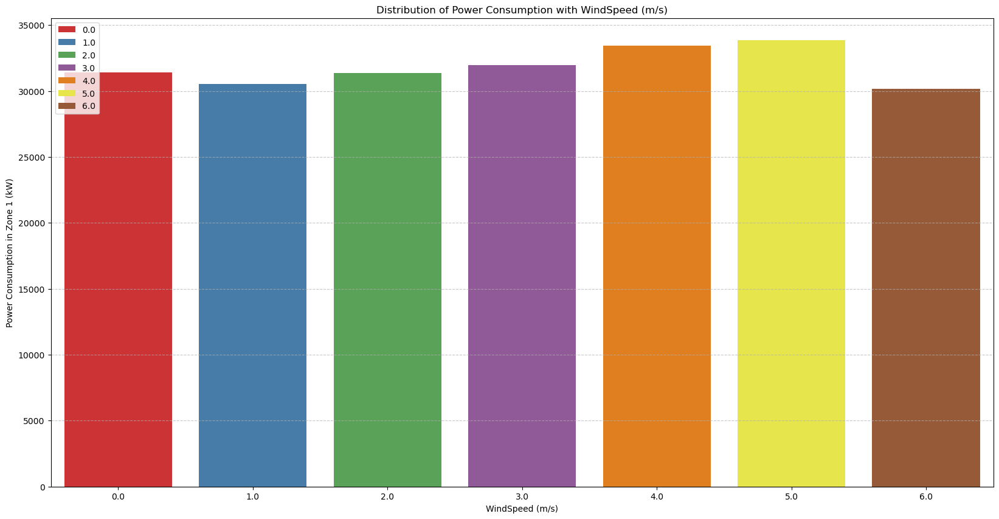

In [36]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['WindSpeed'].round(0), y='PowerConsumption_Zone1', data=df, errorbar=None, hue=df['WindSpeed'].round(0), palette='Set1')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('WindSpeed (m/s)')
plt.ylabel('Power Consumption in Zone 1 (kW)')
plt.legend(loc='upper left')
plt.title('Distribution of Power Consumption with WindSpeed (m/s)')
plt.show()

In [37]:
df['GeneralDiffuseFlows'].describe()

count    52416.000000
mean       182.696614
std        264.400960
min          0.004000
25%          0.062000
50%          5.035500
75%        319.600000
max       1163.000000
Name: GeneralDiffuseFlows, dtype: float64

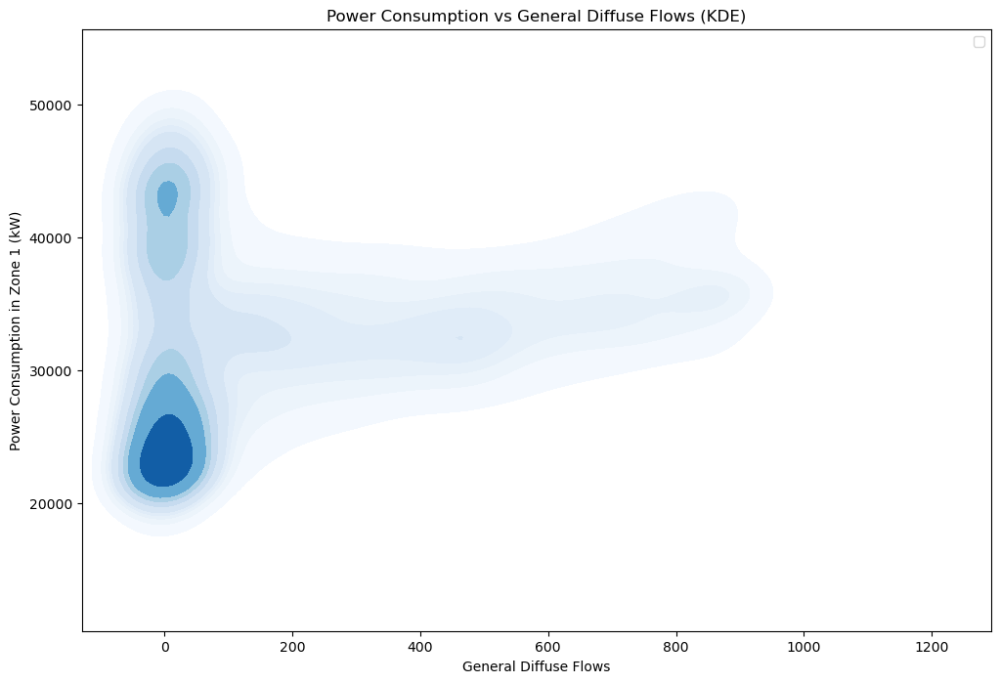

In [38]:
plt.figure(figsize=(12, 8))

sns.kdeplot(x=df['GeneralDiffuseFlows'], y=df['PowerConsumption_Zone1'], cmap="Blues", fill=True)

plt.title('Power Consumption vs General Diffuse Flows (KDE)')
plt.legend(['Power Consumption vs General Diffuse Flows'])
plt.xlabel('General Diffuse Flows')
plt.ylabel('Power Consumption in Zone 1 (kW)')

plt.show()


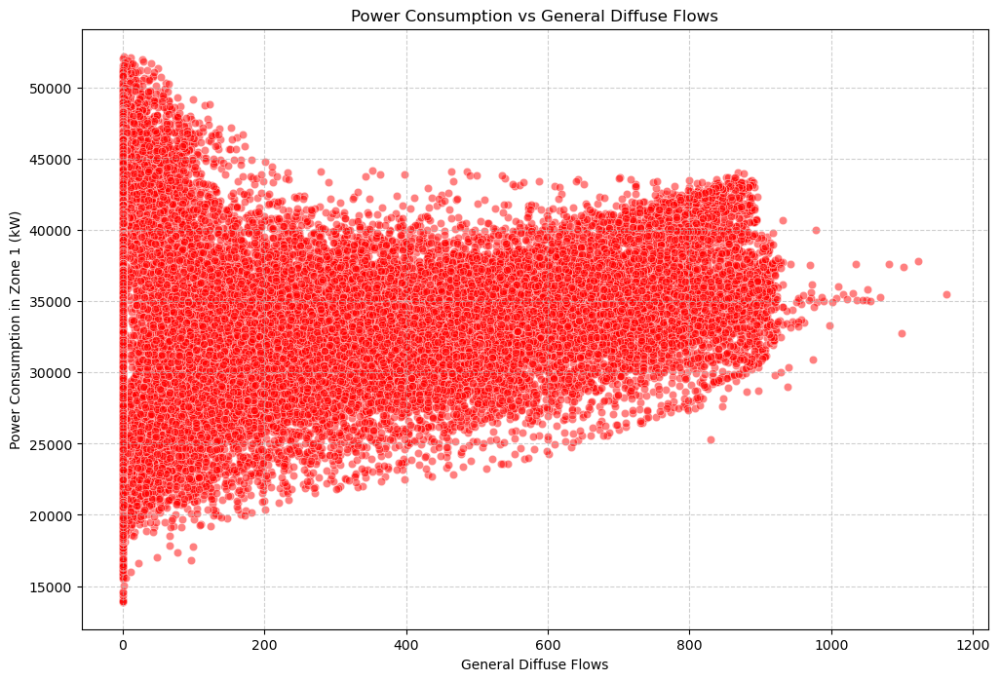

In [39]:
plt.figure(figsize=(12, 8))  # Set figure size

sns.scatterplot(x=df['GeneralDiffuseFlows'], y=df['PowerConsumption_Zone1'], alpha=0.5, color='red')  # Create scatter plot

plt.title('Power Consumption vs General Diffuse Flows')
plt.xlabel('General Diffuse Flows')
plt.ylabel('Power Consumption in Zone 1 (kW)')

plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


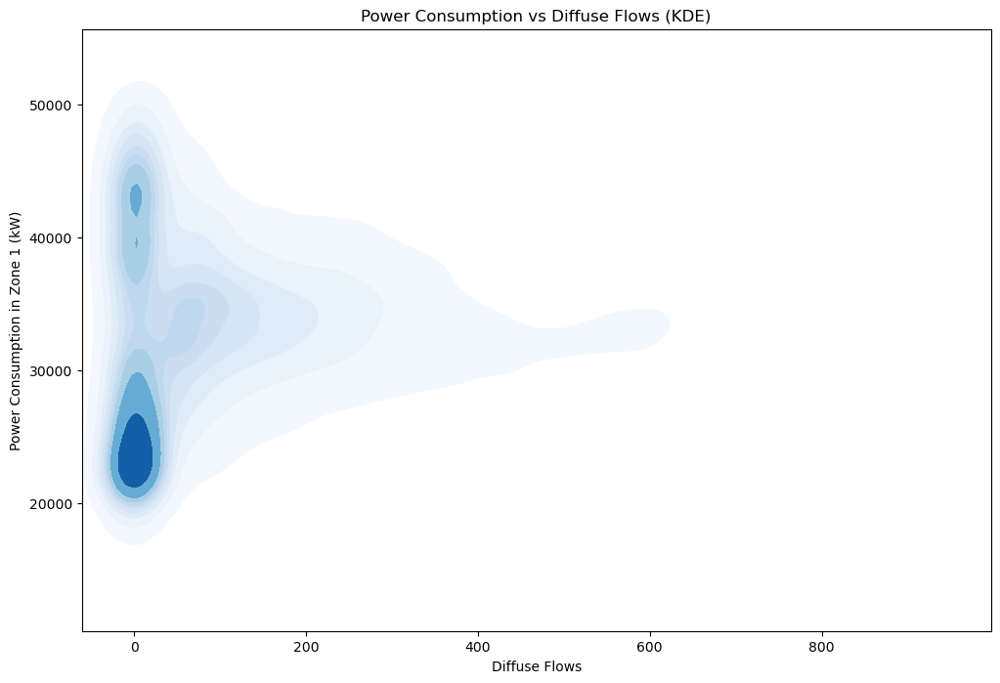

In [40]:
plt.figure(figsize=(12, 8))

sns.kdeplot(x=df['DiffuseFlows'], y=df['PowerConsumption_Zone1'], cmap="Blues", fill=True)

plt.title('Power Consumption vs Diffuse Flows (KDE)')
plt.xlabel('Diffuse Flows')
plt.ylabel('Power Consumption in Zone 1 (kW)')

plt.show()

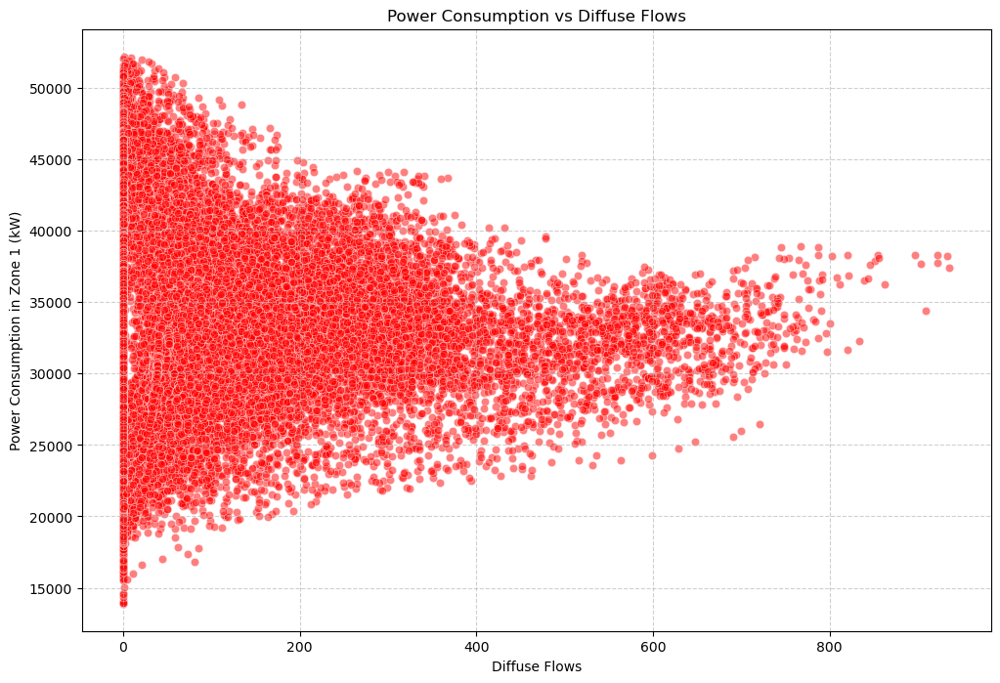

In [41]:
plt.figure(figsize=(12, 8))  # Set figure size

sns.scatterplot(x=df['DiffuseFlows'], y=df['PowerConsumption_Zone1'], alpha=0.5, color='red')  # Create scatter plot

plt.title('Power Consumption vs Diffuse Flows')
plt.xlabel('Diffuse Flows')
plt.ylabel('Power Consumption in Zone 1 (kW)')

plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### Zone 2 Analysis

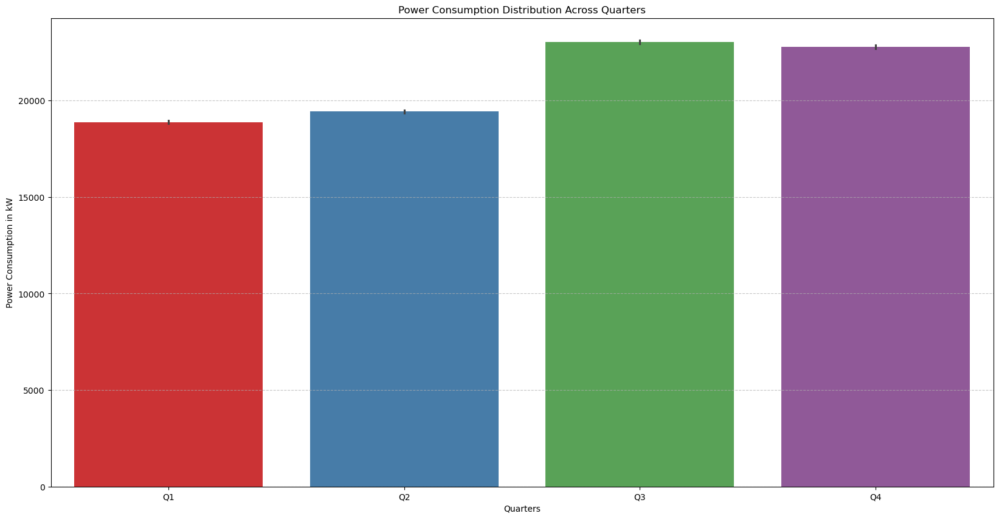

<Figure size 640x480 with 0 Axes>

In [42]:
# Power Consumption Distribution Across Quarters

plt.figure(figsize=(20, 10))
sns.barplot(x='Quarter', y='PowerConsumption_Zone2', data=df, hue='Quarter', palette='Set1')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Quarters')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Quarters')
plt.show()
plt.tight_layout()

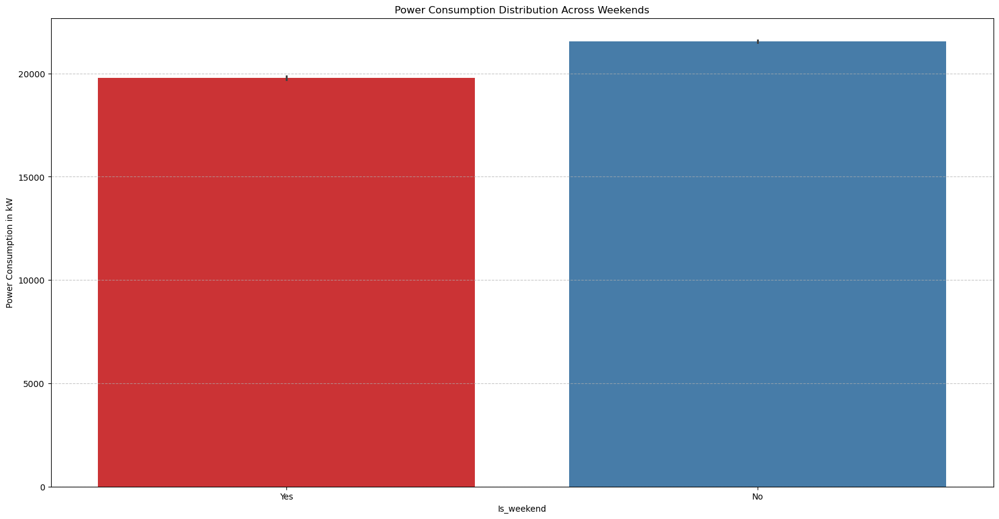

In [43]:
plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x=df['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),  # Correct apply usage
            y='PowerConsumption_Zone2', data=df, hue=df['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'), palette='Set1')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Weekends')
plt.show()

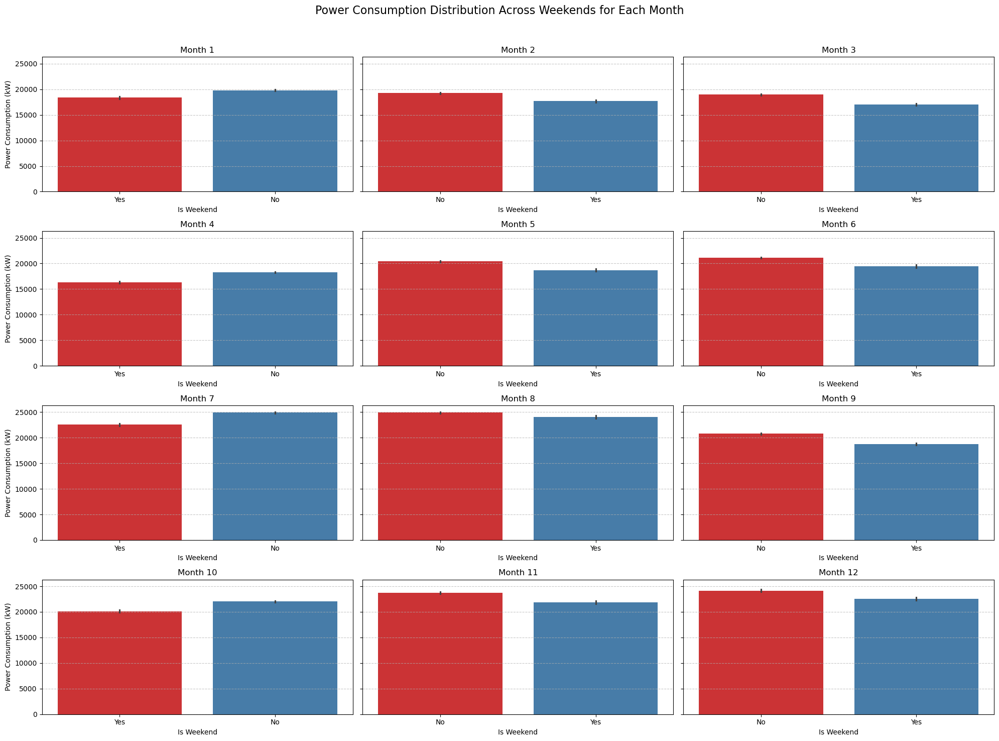

In [44]:
# Create a figure with subplots (3 rows, 4 columns for 12 months)
fig, axes = plt.subplots(4, 3, figsize=(20, 15), sharey=True)  # 3x3 grid for 12 months
fig.suptitle('Power Consumption Distribution Across Weekends for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(sorted(df['Month'].unique())):
    ax = axes[i // 3, i % 3]  # Get subplot position in 3x4 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart
    sns.barplot(
        x=df_month['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),  
        y=df_month['PowerConsumption_Zone2'], 
        hue=df_month['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),
        palette='Set1', 
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Is Weekend')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

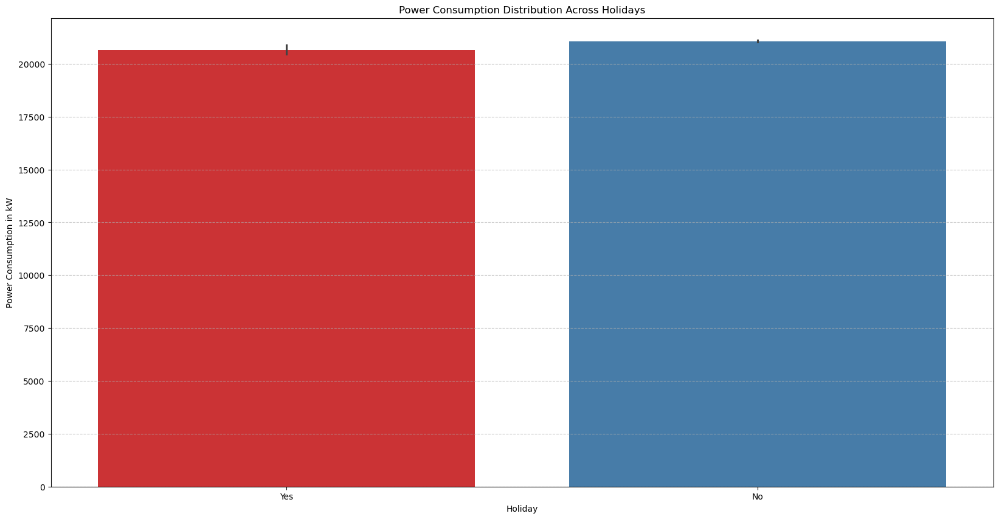

In [45]:

plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x=df['Holiday'].apply(lambda x: 'No' if x==0 else 'Yes'), y='PowerConsumption_Zone2', data=df, hue=df['Holiday'].apply(lambda x: 'No' if x==0 else 'Yes'), palette='Set1')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Holidays')
plt.show()

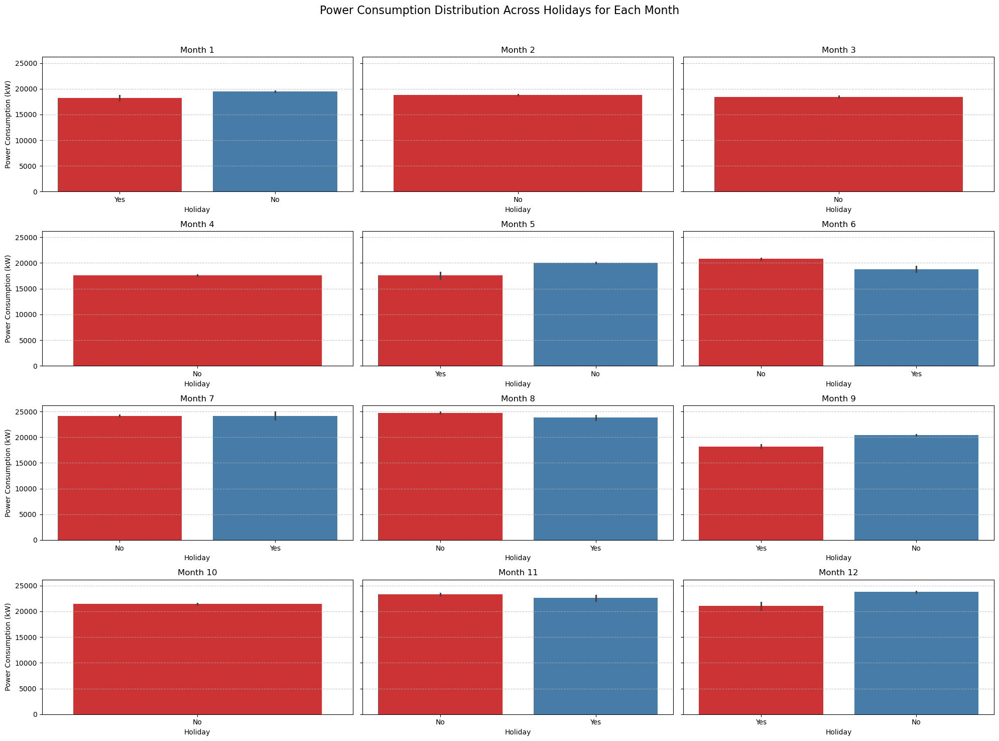

In [46]:
# Create a figure with subplots (3 rows, 4 columns for 12 months)
fig, axes = plt.subplots(4, 3, figsize=(20, 15), sharey=True)  # 3x3 grid for 12 months
fig.suptitle('Power Consumption Distribution Across Holidays for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(sorted(df['Month'].unique())):
    ax = axes[i // 3, i % 3]  # Get subplot position in 3x4 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart
    sns.barplot(
        x=df_month['Holiday'].apply(lambda x: 'No' if x == 0 else 'Yes'),  
        y=df_month['PowerConsumption_Zone2'], 
        hue=df_month['Holiday'].apply(lambda x: 'No' if x == 0 else 'Yes'),
        palette='Set1', 
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Holiday')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

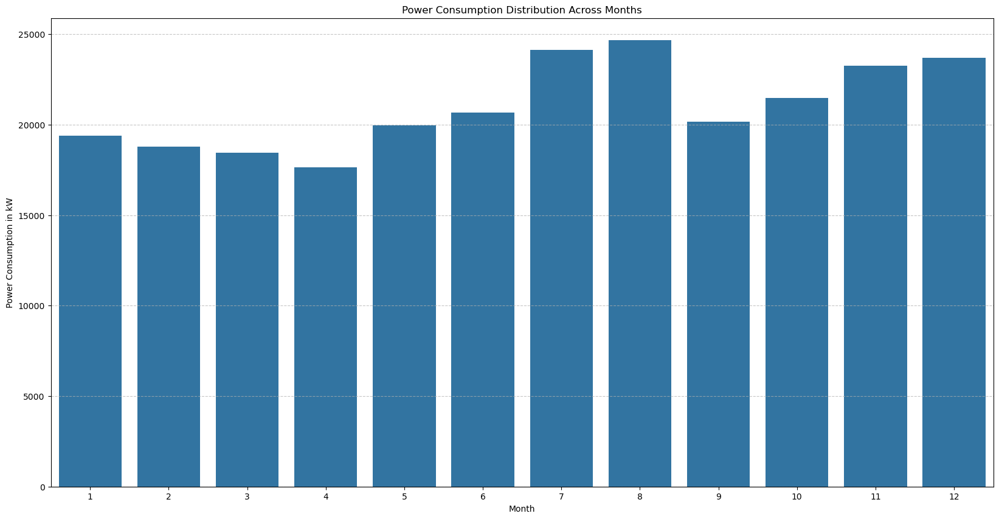

In [47]:
plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x='Month', y='PowerConsumption_Zone2', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Months')
plt.show()

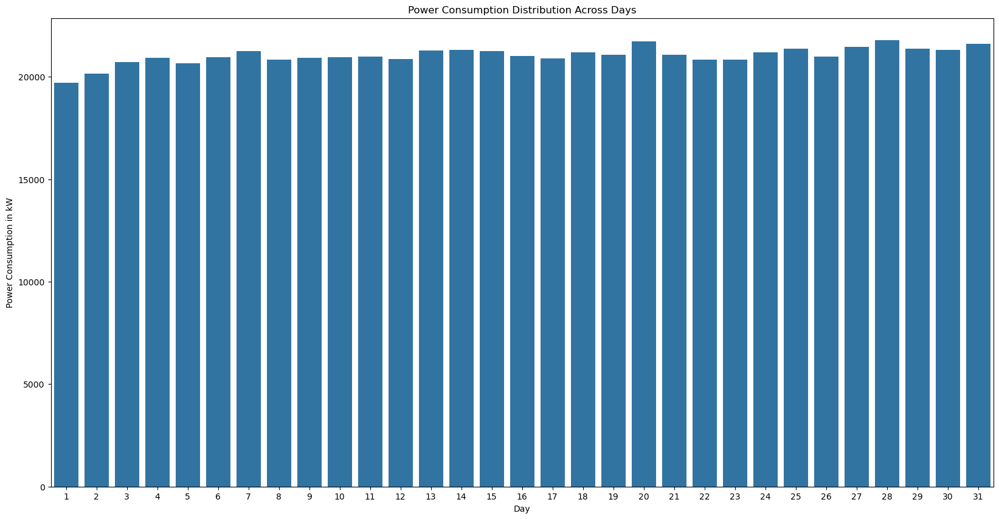

In [48]:
plt.figure(figsize=(20, 10))
sns.barplot(x='Day', y='PowerConsumption_Zone2', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Days')
plt.show()

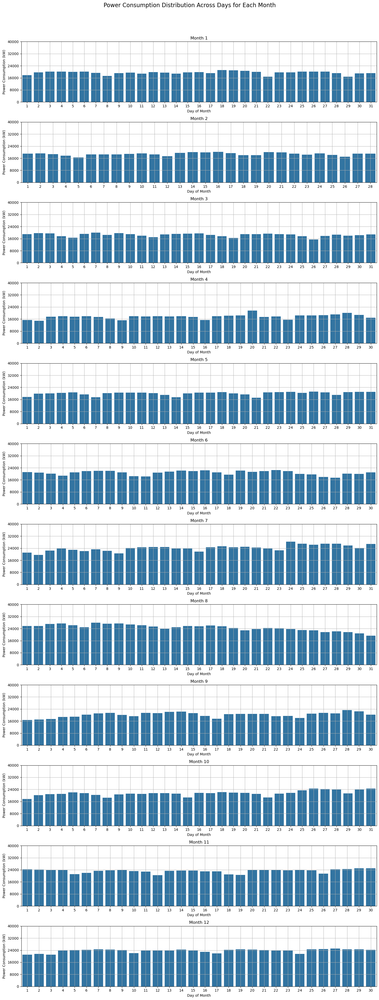

In [49]:
# Create a 12x1 grid for 12 months (12 rows, 1 column)
fig, axes = plt.subplots(12, 1, figsize=(15, 40), sharey=True)
fig.suptitle('Power Consumption Distribution Across Days for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(df['Month'].unique()):  # Loop through all 12 months without sorting
    ax = axes[i]  # Get subplot position in 12x1 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart for power consumption across days
    sns.barplot(
        x='Day', 
        y='PowerConsumption_Zone2', 
        data=df_month, 
        errorbar=None,
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day of Month')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid()

    ax.set_yticks(np.arange(0, 40001, 8000))  # Set y-axis ticks for better readability

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

Text(0.5, 1.0, 'Power Consumption Distribution Across Time')

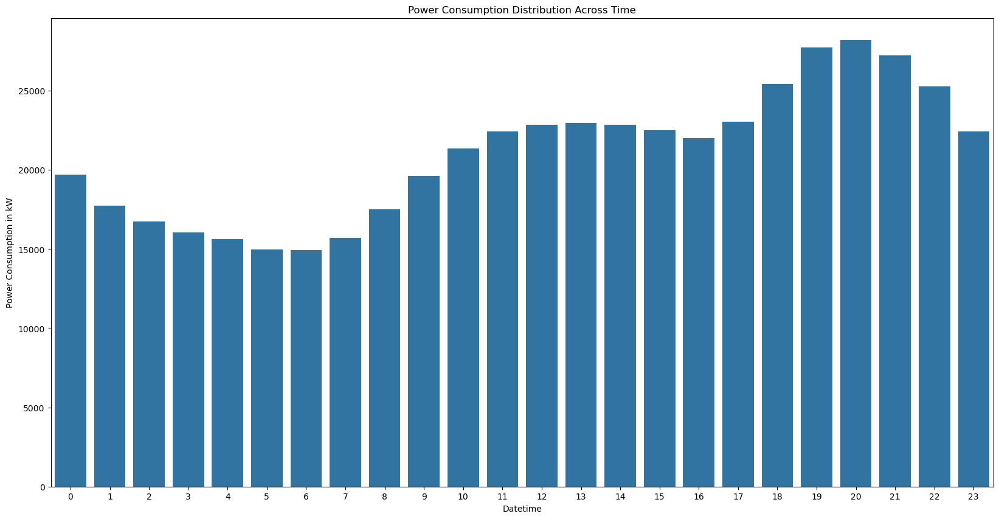

In [50]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['Datetime'].dt.hour, y='PowerConsumption_Zone2', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Time')

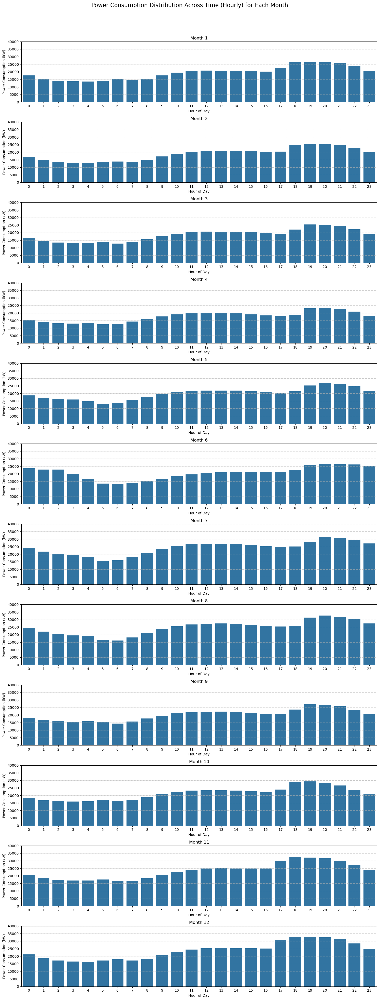

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create a 12x1 grid for 12 months (12 rows, 1 column)
fig, axes = plt.subplots(12, 1, figsize=(15, 40), sharey=True)
fig.suptitle('Power Consumption Distribution Across Time (Hourly) for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(df['Month'].unique()):  # Loop through all 12 months without sorting
    ax = axes[i]  # Get subplot position in 12x1 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart for power consumption across hours of the day
    sns.barplot(
        x=df_month['Datetime'].dt.hour,  # Extract hour from the 'Datetime' column
        y='PowerConsumption_Zone2', 
        data=df_month, 
        errorbar=None,
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Hour of Day')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    ax.set_yticks(np.arange(0, 40001, 5000))  # Set y-axis ticks for better readability

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()


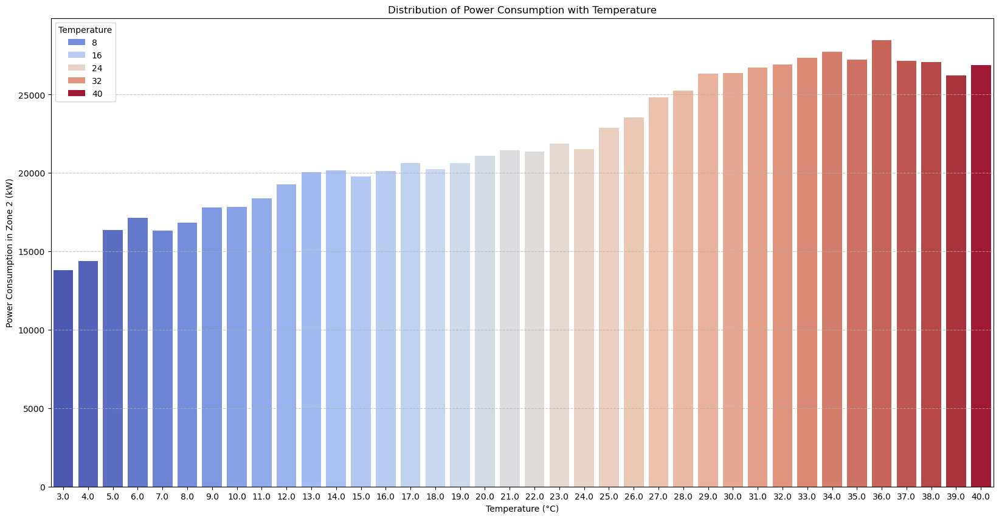

In [52]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['Temperature'].round(0), y='PowerConsumption_Zone2', data=df, errorbar=None, hue=df['Temperature'].round(0), palette='coolwarm')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Temperature (°C)')
plt.ylabel('Power Consumption in Zone 2 (kW)')
plt.title('Distribution of Power Consumption with Temperature')
plt.show()

C:\Users\anbuv\AppData\Local\Temp\ipykernel_2148\4225341867.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


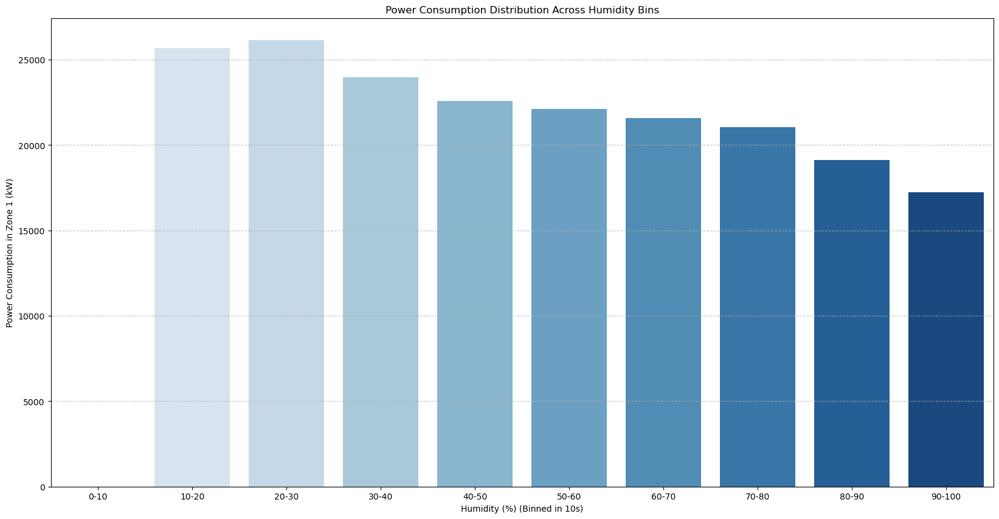

In [53]:
# Define bins (0-10, 10-20, 20-30, 30-40, etc.)
bins = range(0, 101, 10)  # 0 to 100 with step of 10
labels = [f"{b}-{b+10}" for b in bins[:-1]] 

# Create a new column in the dataframe for binned humidity
df['Humidity_Bins'] = pd.cut(df['Humidity'], bins=bins, labels=labels, include_lowest=True)

# Plot the binned humidity values
plt.figure(figsize=(20, 10))
sns.barplot(
    x='Humidity_Bins', 
    y='PowerConsumption_Zone2', 
    data=df, 
    errorbar=None, 
    palette='Blues'
)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Humidity (%) (Binned in 10s)')
plt.ylabel('Power Consumption in Zone 1 (kW)')
plt.title('Power Consumption Distribution Across Humidity Bins')
plt.show()

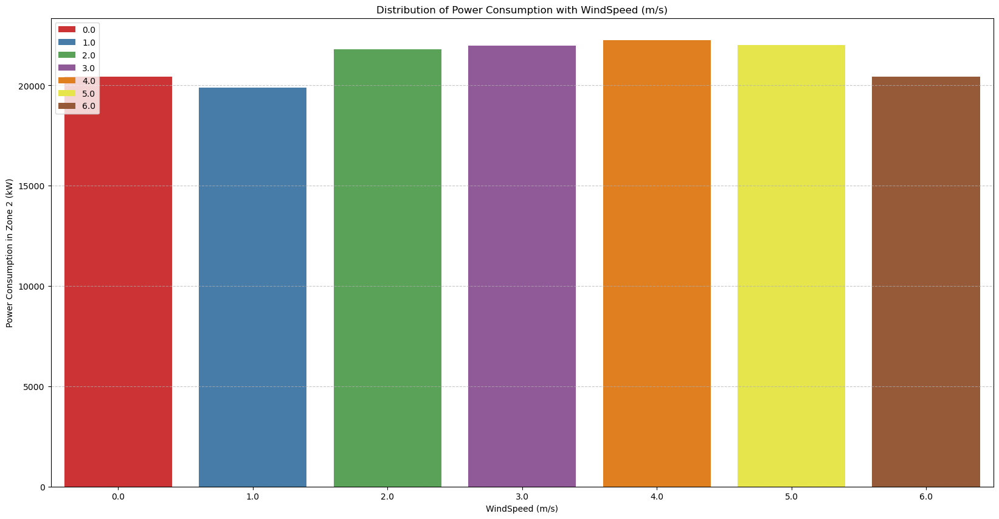

In [54]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['WindSpeed'].round(0), y='PowerConsumption_Zone2', data=df, errorbar=None, hue=df['WindSpeed'].round(0), palette='Set1')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('WindSpeed (m/s)')
plt.ylabel('Power Consumption in Zone 2 (kW)')
plt.legend(loc='upper left')
plt.title('Distribution of Power Consumption with WindSpeed (m/s)')
plt.show()

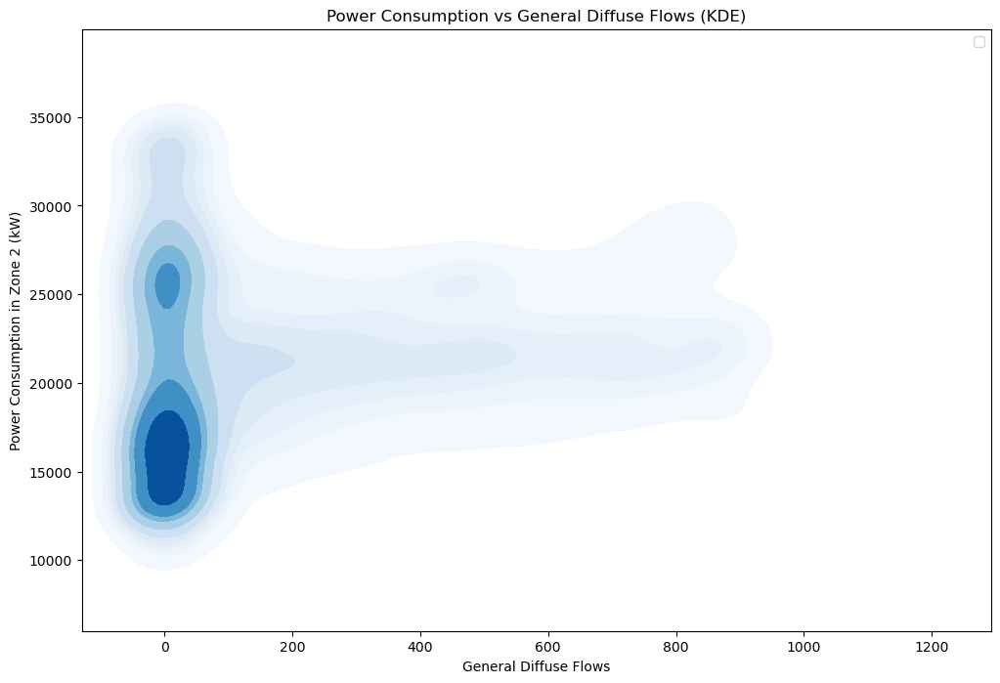

In [55]:
plt.figure(figsize=(12, 8))

sns.kdeplot(x=df['GeneralDiffuseFlows'], y=df['PowerConsumption_Zone2'], cmap="Blues", fill=True)

plt.title('Power Consumption vs General Diffuse Flows (KDE)')
plt.legend(['Power Consumption vs General Diffuse Flows'])
plt.xlabel('General Diffuse Flows')
plt.ylabel('Power Consumption in Zone 2 (kW)')

plt.show()


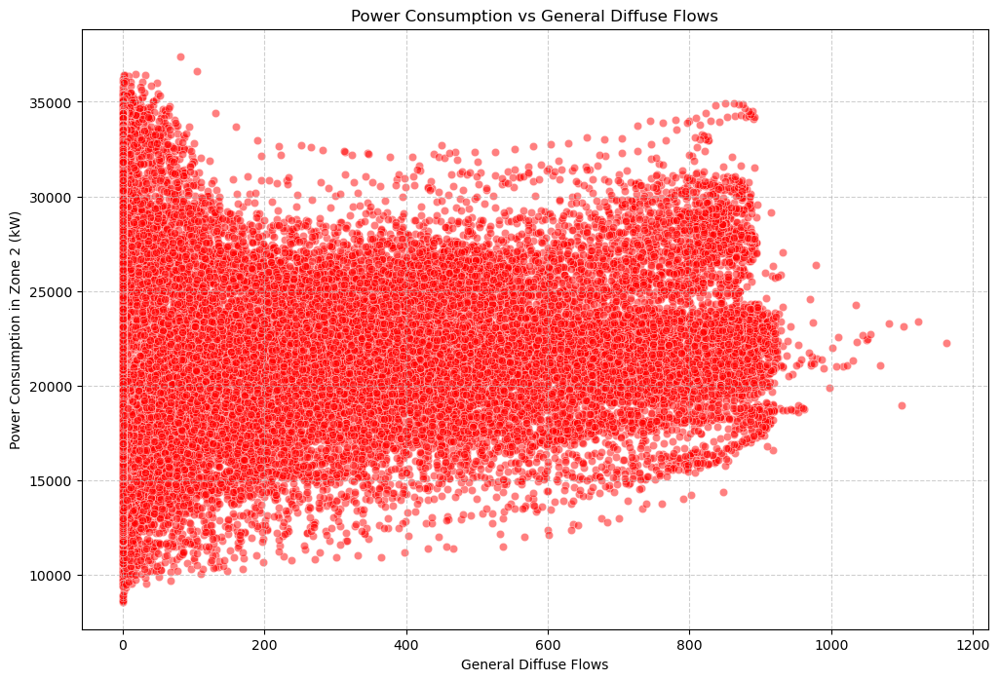

In [56]:
plt.figure(figsize=(12, 8))  # Set figure size

sns.scatterplot(x=df['GeneralDiffuseFlows'], y=df['PowerConsumption_Zone2'], alpha=0.5, color='red')  # Create scatter plot

plt.title('Power Consumption vs General Diffuse Flows')
plt.xlabel('General Diffuse Flows')
plt.ylabel('Power Consumption in Zone 2 (kW)')

plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


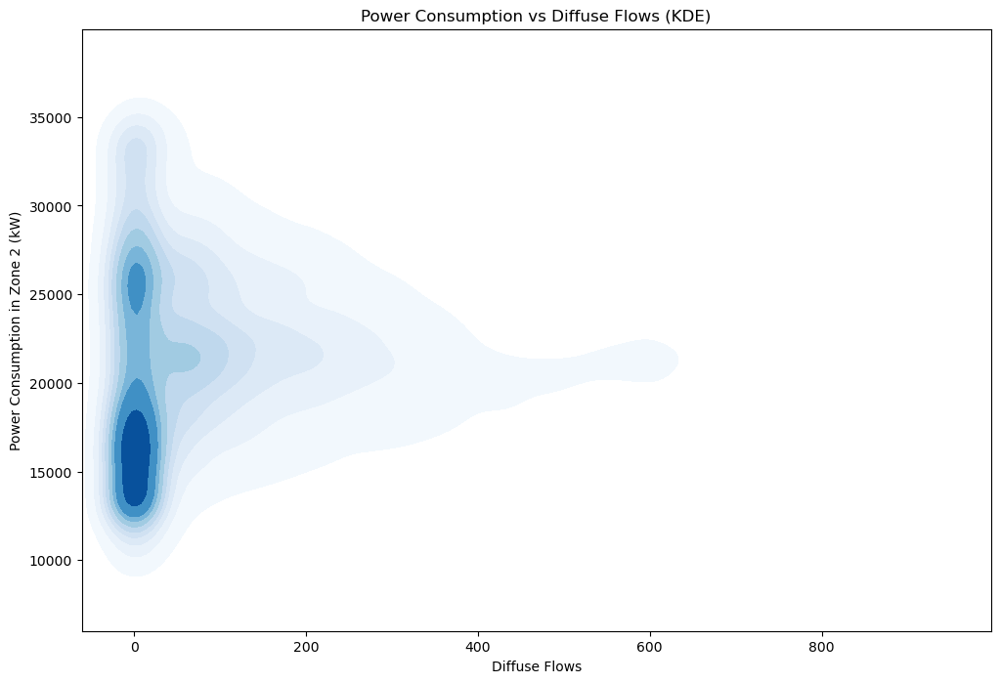

In [57]:
plt.figure(figsize=(12, 8))

sns.kdeplot(x=df['DiffuseFlows'], y=df['PowerConsumption_Zone2'], cmap="Blues", fill=True)

plt.title('Power Consumption vs Diffuse Flows (KDE)')
plt.xlabel('Diffuse Flows')
plt.ylabel('Power Consumption in Zone 2 (kW)')

plt.show()

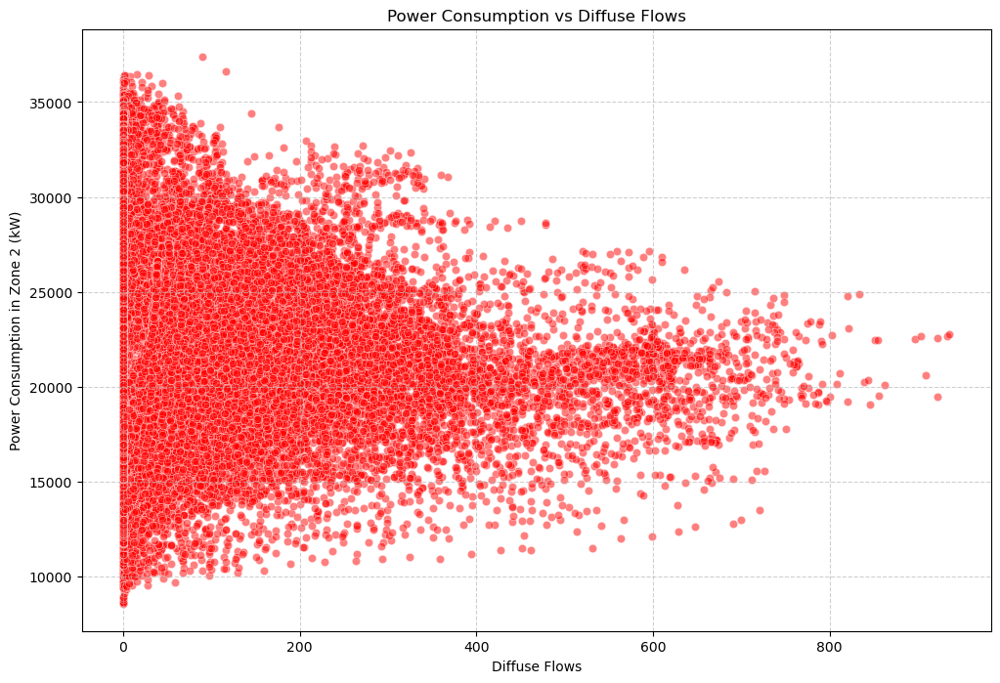

In [58]:
plt.figure(figsize=(12, 8))  # Set figure size

sns.scatterplot(x=df['DiffuseFlows'], y=df['PowerConsumption_Zone2'], alpha=0.5, color='red')  # Create scatter plot

plt.title('Power Consumption vs Diffuse Flows')
plt.xlabel('Diffuse Flows')
plt.ylabel('Power Consumption in Zone 2 (kW)')

plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### Zone 3 Analysis

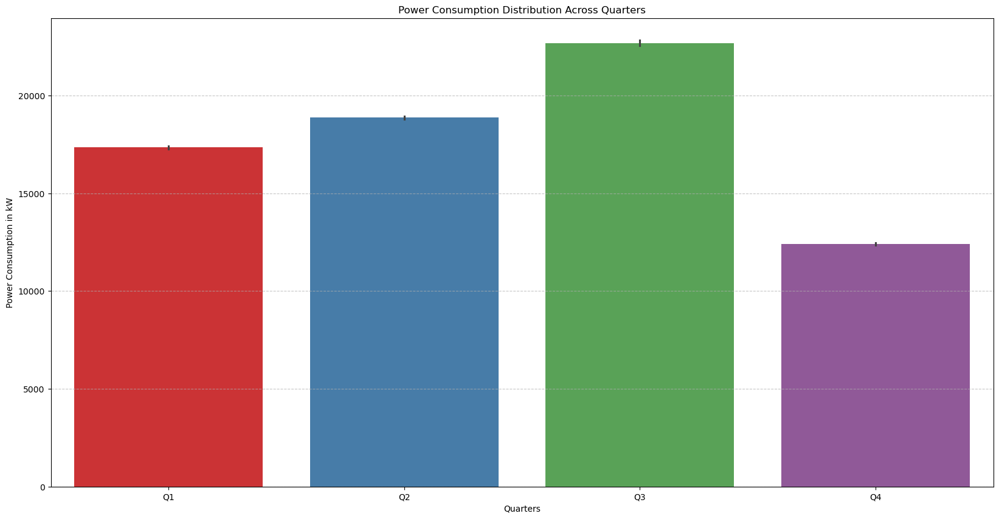

<Figure size 640x480 with 0 Axes>

In [59]:
# Power Consumption Distribution Across Quarters

plt.figure(figsize=(20, 10))
sns.barplot(x='Quarter', y='PowerConsumption_Zone3', data=df, hue='Quarter', palette='Set1')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Quarters')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Quarters')
plt.show()
plt.tight_layout()

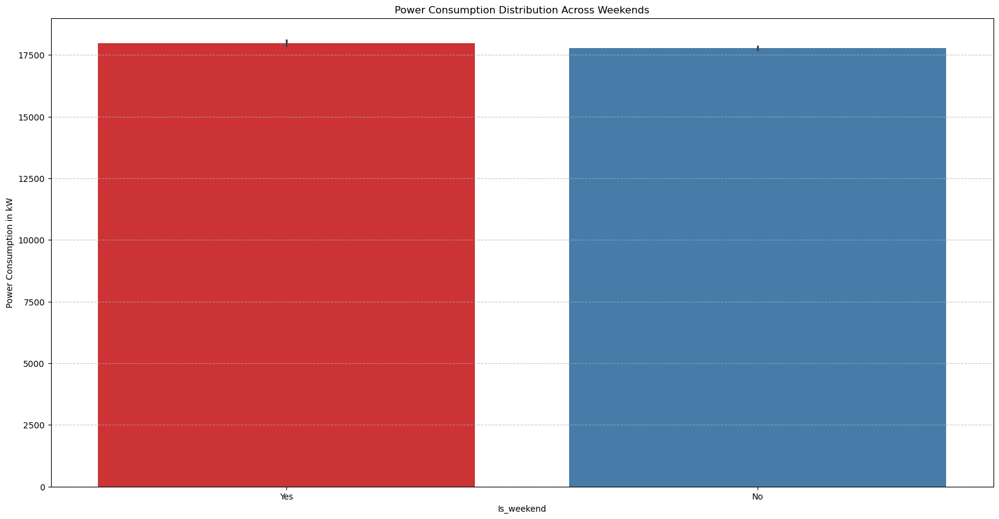

In [60]:
plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x=df['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),  # Correct apply usage
            y='PowerConsumption_Zone3', data=df, hue=df['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'), palette='Set1')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Weekends')
plt.show()

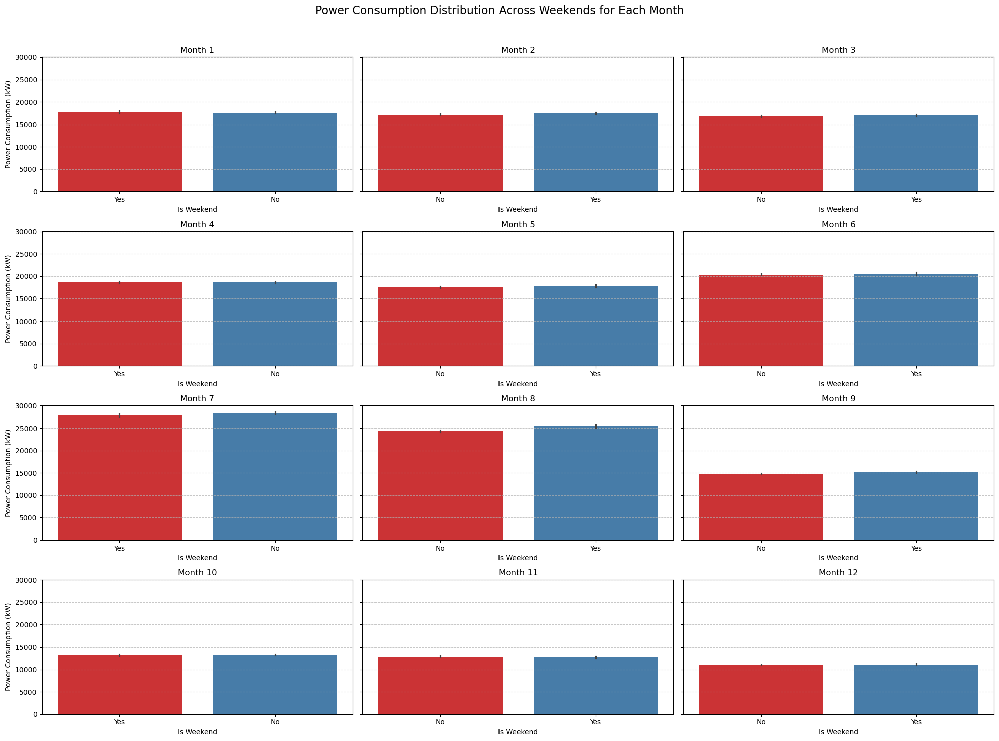

In [61]:
# Create a figure with subplots (3 rows, 4 columns for 12 months)
fig, axes = plt.subplots(4, 3, figsize=(20, 15), sharey=True)  # 3x3 grid for 12 months
fig.suptitle('Power Consumption Distribution Across Weekends for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(sorted(df['Month'].unique())):
    ax = axes[i // 3, i % 3]  # Get subplot position in 3x4 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart
    sns.barplot(
        x=df_month['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),  
        y=df_month['PowerConsumption_Zone3'], 
        hue=df_month['Is_weekend'].apply(lambda x: 'No' if x == 0 else 'Yes'),
        palette='Set1', 
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Is Weekend')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

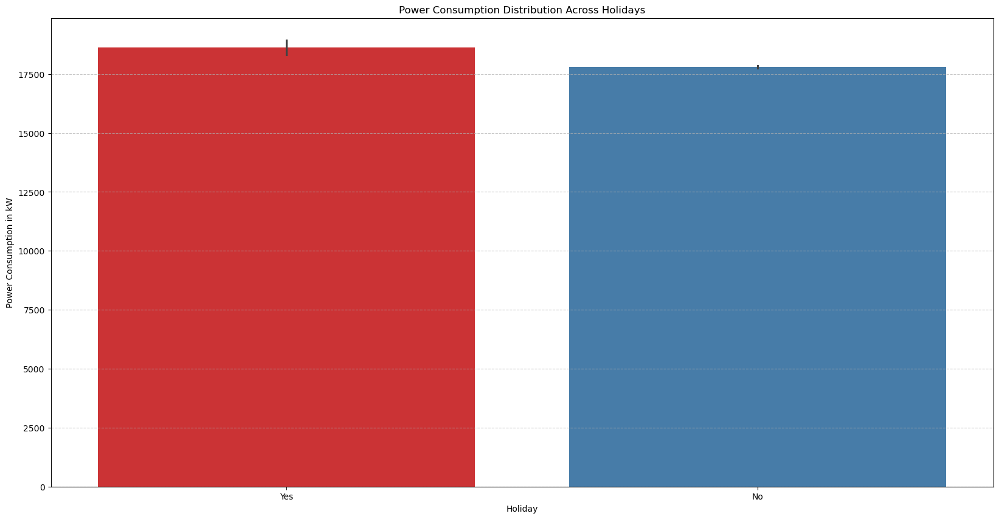

In [62]:

plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x=df['Holiday'].apply(lambda x: 'No' if x==0 else 'Yes'), y='PowerConsumption_Zone3', data=df, hue=df['Holiday'].apply(lambda x: 'No' if x==0 else 'Yes'), palette='Set1')
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Holidays')
plt.show()

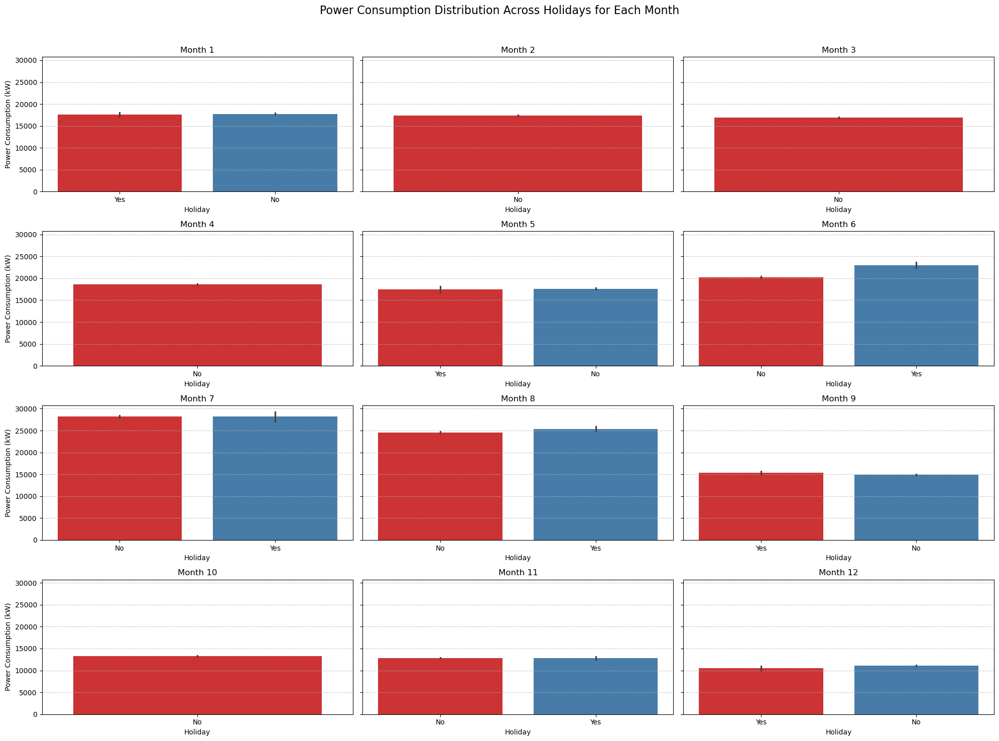

In [63]:
# Create a figure with subplots (3 rows, 4 columns for 12 months)
fig, axes = plt.subplots(4, 3, figsize=(20, 15), sharey=True)  # 3x3 grid for 12 months
fig.suptitle('Power Consumption Distribution Across Holidays for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(sorted(df['Month'].unique())):
    ax = axes[i // 3, i % 3]  # Get subplot position in 3x4 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart
    sns.barplot(
        x=df_month['Holiday'].apply(lambda x: 'No' if x == 0 else 'Yes'),  
        y=df_month['PowerConsumption_Zone3'], 
        hue=df_month['Holiday'].apply(lambda x: 'No' if x == 0 else 'Yes'),
        palette='Set1', 
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Holiday')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

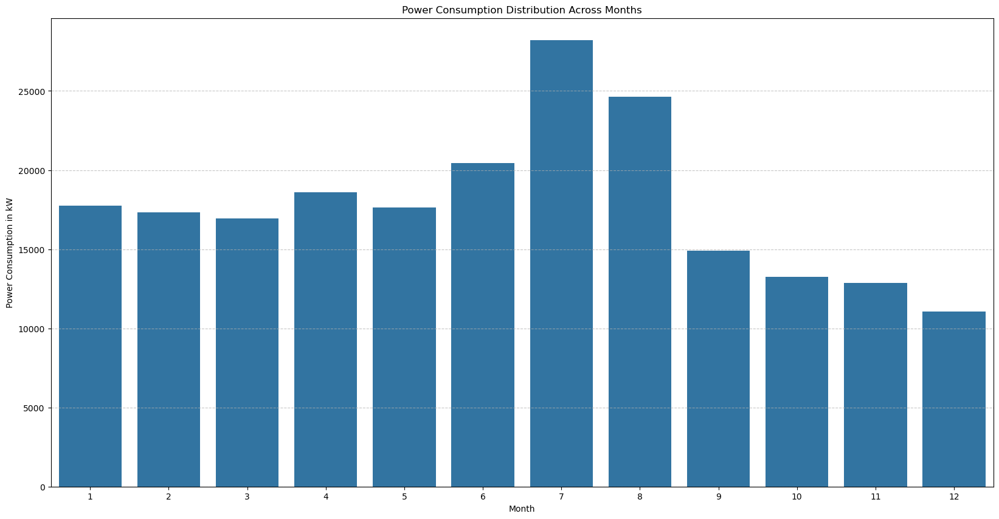

In [64]:
plt.figure(figsize=(20, 10))
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.barplot(x='Month', y='PowerConsumption_Zone3', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Months')
plt.show()

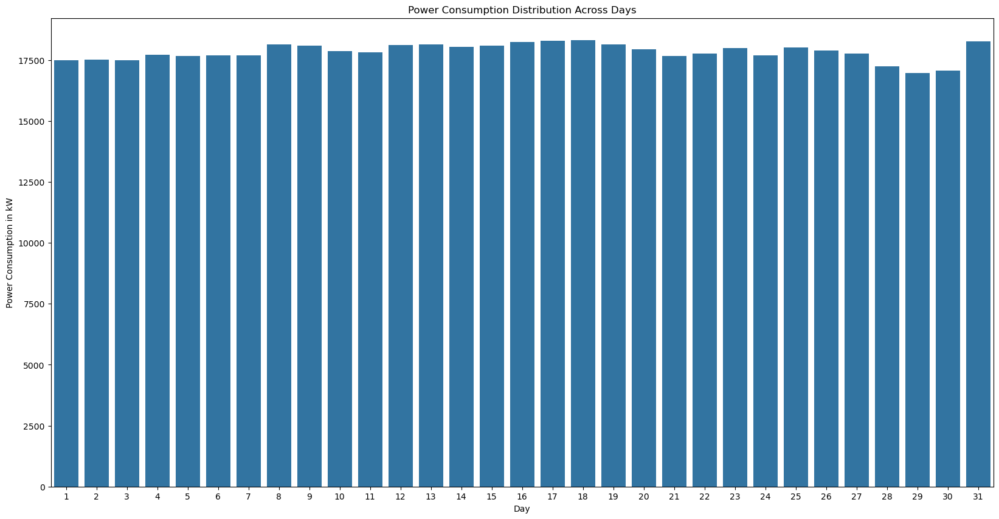

In [65]:
plt.figure(figsize=(20, 10))
sns.barplot(x='Day', y='PowerConsumption_Zone3', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Days')
plt.show()

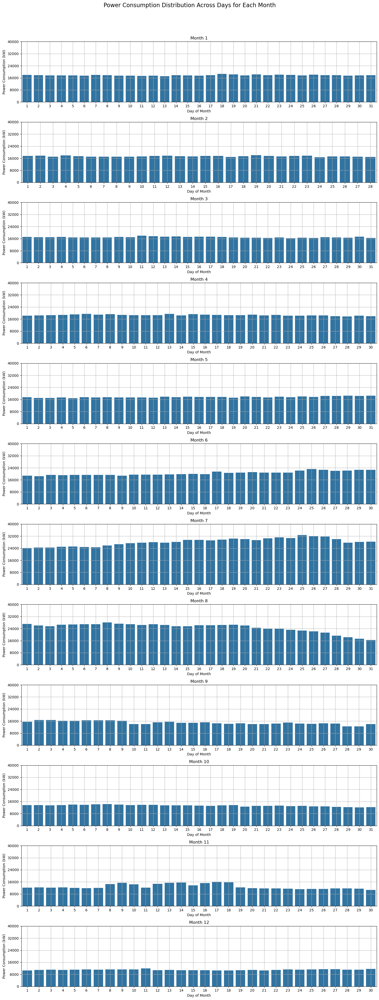

In [66]:
# Create a 12x1 grid for 12 months (12 rows, 1 column)
fig, axes = plt.subplots(12, 1, figsize=(15, 40), sharey=True)
fig.suptitle('Power Consumption Distribution Across Days for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(df['Month'].unique()):  # Loop through all 12 months without sorting
    ax = axes[i]  # Get subplot position in 12x1 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart for power consumption across days
    sns.barplot(
        x='Day', 
        y='PowerConsumption_Zone3', 
        data=df_month, 
        errorbar=None,
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day of Month')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid()

    ax.set_yticks(np.arange(0, 40001, 8000))  # Set y-axis ticks for better readability

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()

Text(0.5, 1.0, 'Power Consumption Distribution Across Time')

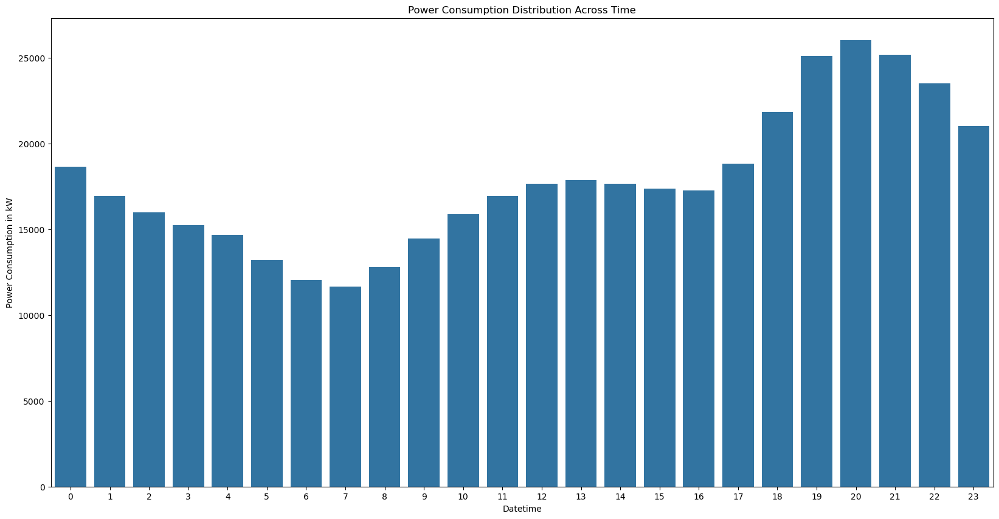

In [67]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['Datetime'].dt.hour, y='PowerConsumption_Zone3', data=df, errorbar=None)
plt.ylabel('Power Consumption in kW')
plt.title('Power Consumption Distribution Across Time')

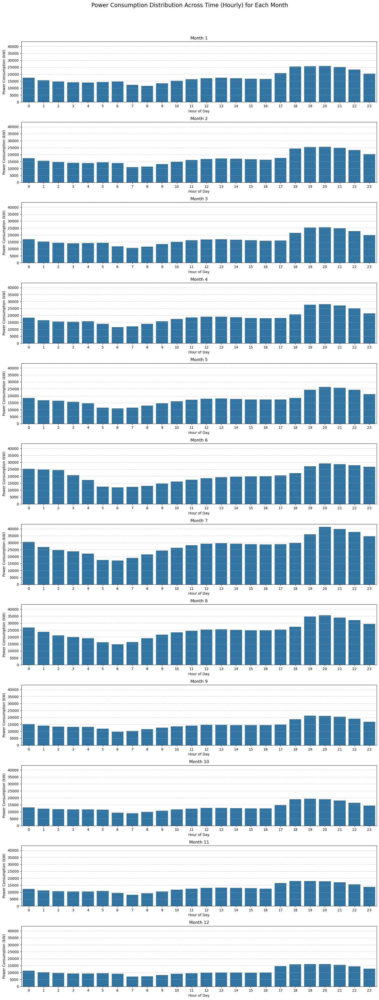

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create a 12x1 grid for 12 months (12 rows, 1 column)
fig, axes = plt.subplots(12, 1, figsize=(15, 40), sharey=True)
fig.suptitle('Power Consumption Distribution Across Time (Hourly) for Each Month', fontsize=16)

# Loop through each month and create a subplot
for i, month in enumerate(df['Month'].unique()):  # Loop through all 12 months without sorting
    ax = axes[i]  # Get subplot position in 12x1 grid
    
    # Filter data for the current month
    df_month = df[df['Month'] == month]
    
    # Plot bar chart for power consumption across hours of the day
    sns.barplot(
        x=df_month['Datetime'].dt.hour,  # Extract hour from the 'Datetime' column
        y='PowerConsumption_Zone3', 
        data=df_month, 
        errorbar=None,
        ax=ax
    )
    
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Hour of Day')
    ax.set_ylabel('Power Consumption (kW)')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    ax.set_yticks(np.arange(0, 40001, 5000))  # Set y-axis ticks for better readability

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # To avoid overlap with suptitle
plt.show()


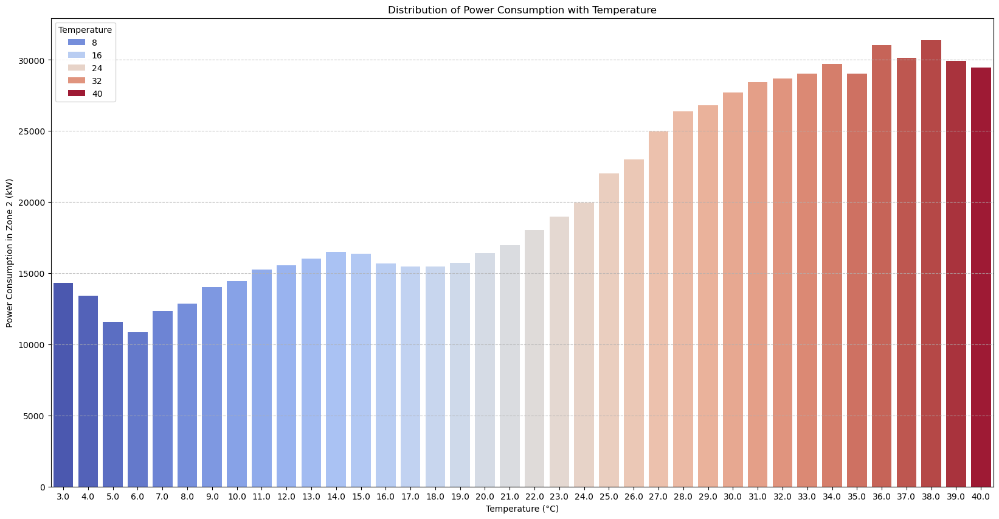

In [69]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['Temperature'].round(0), y='PowerConsumption_Zone3', data=df, errorbar=None, hue=df['Temperature'].round(0), palette='coolwarm')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Temperature (°C)')
plt.ylabel('Power Consumption in Zone 2 (kW)')
plt.title('Distribution of Power Consumption with Temperature')
plt.show()

C:\Users\anbuv\AppData\Local\Temp\ipykernel_2148\4252162910.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


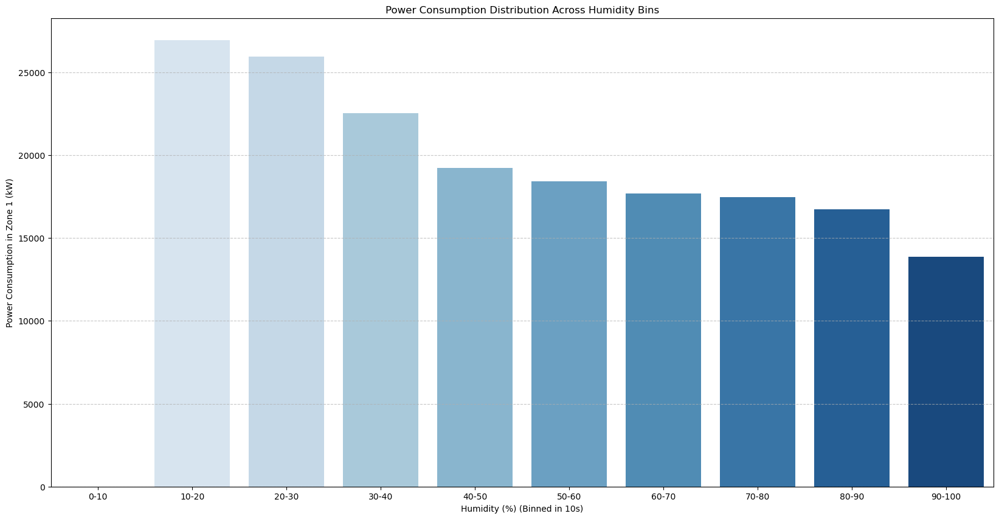

In [70]:
# Define bins (0-10, 10-20, 20-30, 30-40, etc.)
bins = range(0, 101, 10)  # 0 to 100 with step of 10
labels = [f"{b}-{b+10}" for b in bins[:-1]] 

# Create a new column in the dataframe for binned humidity
df['Humidity_Bins'] = pd.cut(df['Humidity'], bins=bins, labels=labels, include_lowest=True)

# Plot the binned humidity values
plt.figure(figsize=(20, 10))
sns.barplot(
    x='Humidity_Bins', 
    y='PowerConsumption_Zone3', 
    data=df, 
    errorbar=None, 
    palette='Blues'
)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('Humidity (%) (Binned in 10s)')
plt.ylabel('Power Consumption in Zone 1 (kW)')
plt.title('Power Consumption Distribution Across Humidity Bins')
plt.show()

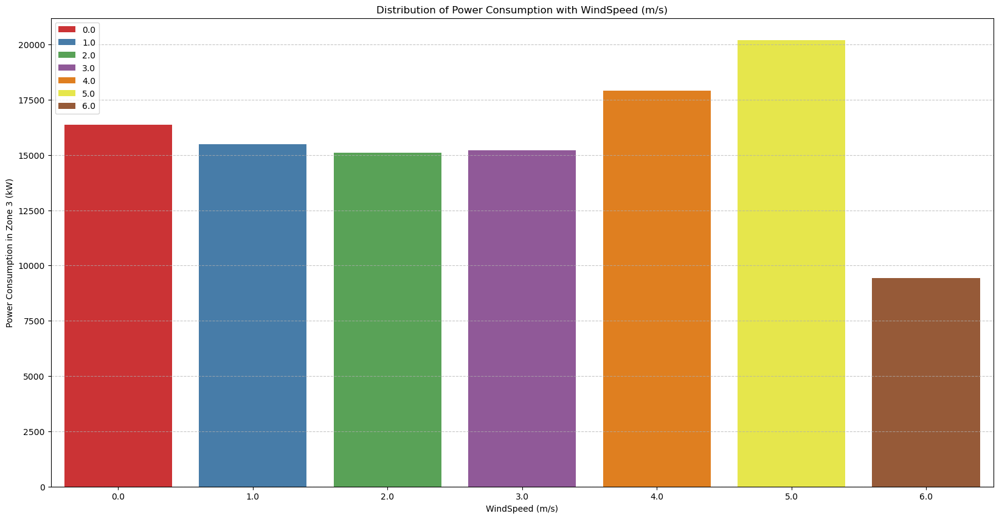

In [71]:
plt.figure(figsize=(20, 10))
sns.barplot(x=df['WindSpeed'].round(0), y='PowerConsumption_Zone3', data=df, errorbar=None, hue=df['WindSpeed'].round(0), palette='Set1')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('WindSpeed (m/s)')
plt.ylabel('Power Consumption in Zone 3 (kW)')
plt.legend(loc='upper left')
plt.title('Distribution of Power Consumption with WindSpeed (m/s)')
plt.show()

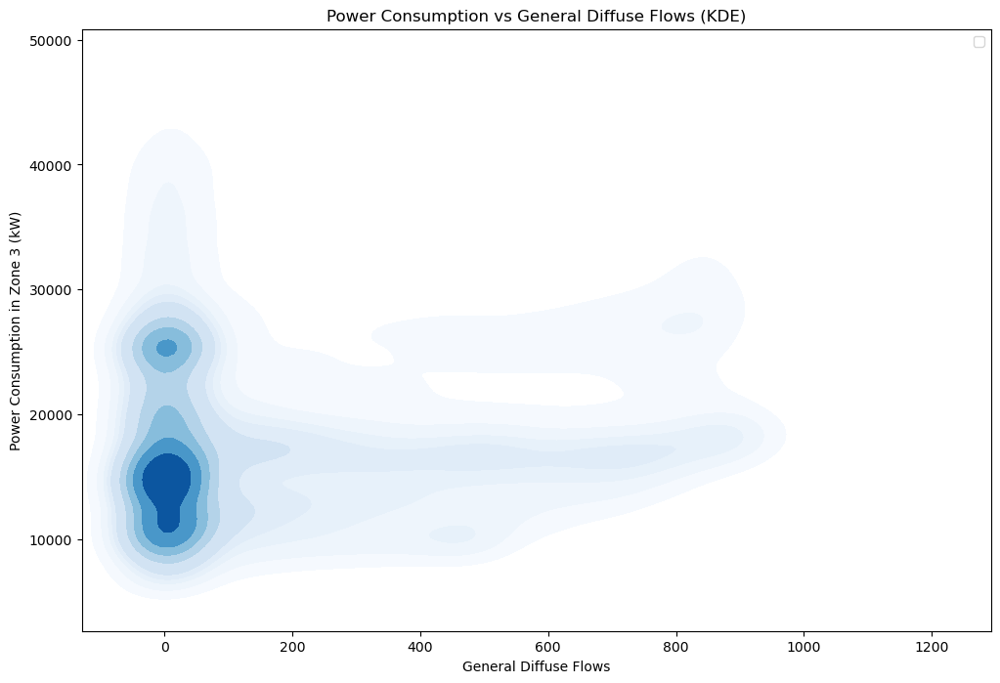

In [72]:
plt.figure(figsize=(12, 8))

sns.kdeplot(x=df['GeneralDiffuseFlows'], y=df['PowerConsumption_Zone3'], cmap="Blues", fill=True)

plt.title('Power Consumption vs General Diffuse Flows (KDE)')
plt.legend(['Power Consumption vs General Diffuse Flows'])
plt.xlabel('General Diffuse Flows')
plt.ylabel('Power Consumption in Zone 3 (kW)')

plt.show()


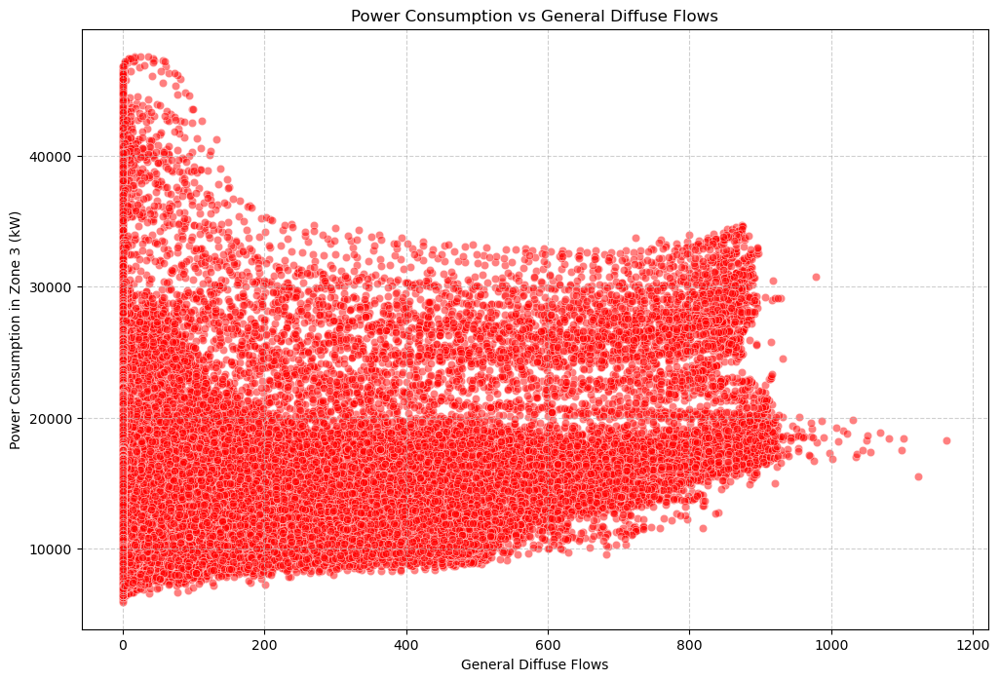

In [73]:
plt.figure(figsize=(12, 8))  # Set figure size

sns.scatterplot(x=df['GeneralDiffuseFlows'], y=df['PowerConsumption_Zone3'], alpha=0.5, color='red')  # Create scatter plot

plt.title('Power Consumption vs General Diffuse Flows')
plt.xlabel('General Diffuse Flows')
plt.ylabel('Power Consumption in Zone 3 (kW)')

plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


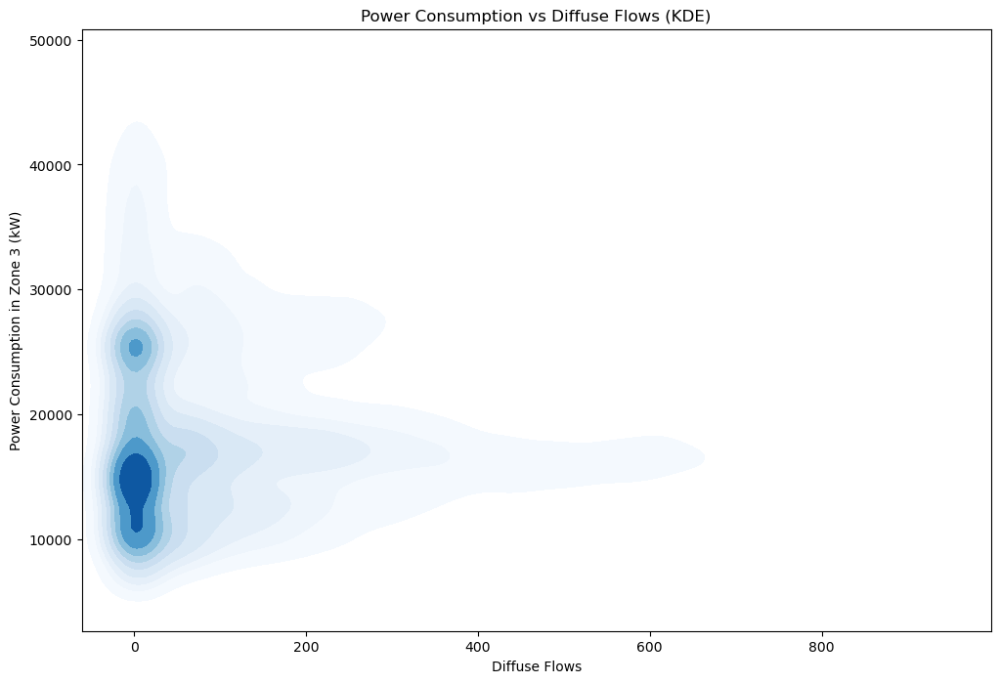

In [74]:
plt.figure(figsize=(12, 8))

sns.kdeplot(x=df['DiffuseFlows'], y=df['PowerConsumption_Zone3'], cmap="Blues", fill=True)

plt.title('Power Consumption vs Diffuse Flows (KDE)')
plt.xlabel('Diffuse Flows')
plt.ylabel('Power Consumption in Zone 3 (kW)')

plt.show()

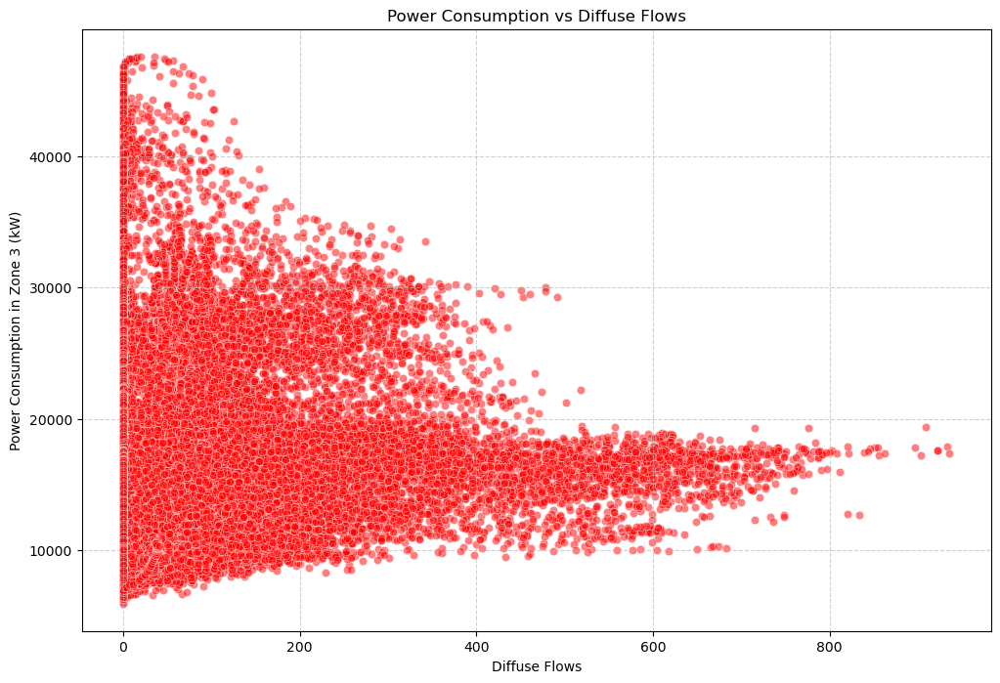

In [75]:
plt.figure(figsize=(12, 8))  # Set figure size

sns.scatterplot(x=df['DiffuseFlows'], y=df['PowerConsumption_Zone3'], alpha=0.5, color='red')  # Create scatter plot

plt.title('Power Consumption vs Diffuse Flows')
plt.xlabel('Diffuse Flows')
plt.ylabel('Power Consumption in Zone 3 (kW)')

plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

In [76]:
df.head().T

,0,1,2,3,4
Datetime,2017-01-01 00:00:00,2017-01-01 00:10:00,2017-01-01 00:20:00,2017-01-01 00:30:00,2017-01-01 00:40:00
Temperature,6.559,6.414,6.313,6.121,5.921
Humidity,73.8,74.5,74.5,75.0,75.7
WindSpeed,0.083,0.083,0.08,0.083,0.081
GeneralDiffuseFlows,0.051,0.07,0.062,0.091,0.048
DiffuseFlows,0.119,0.085,0.1,0.096,0.085
PowerConsumption_Zone1,34055.6962,29814.68354,29128.10127,28228.86076,27335.6962
PowerConsumption_Zone2,16128.87538,19375.07599,19006.68693,18361.09422,17872.34043
PowerConsumption_Zone3,20240.96386,20131.08434,19668.43373,18899.27711,18442.40964
Year,2017,2017,2017,2017,2017


In [77]:
# Drop the Humidity_Bins column

df.drop('Humidity_Bins', axis=1, inplace=True)

In [78]:
# Save the cleaned data to a new CSV file

df.to_csv('cleaned_power_data.csv', index=False)

In [79]:
df.dtypes

Datetime                  datetime64[ns]
Temperature                      float64
Humidity                         float64
WindSpeed                        float64
GeneralDiffuseFlows              float64
DiffuseFlows                     float64
PowerConsumption_Zone1           float64
PowerConsumption_Zone2           float64
PowerConsumption_Zone3           float64
Year                               int32
Month                              int32
Day                                int32
Dayofweek                          int32
Time                              object
Quarter                           object
Is_weekend                         int32
Is_working_day                     int32
Is_working_hour                    int32
week_of_year                       int32
Holiday                            int64
dtype: object

## Key Performance Indicators

In [87]:
# 1. Peak Load Factor (PLF) - Ratio of average load to peak load
peak_loads = {
    'Zone1': df['PowerConsumption_Zone1'].max(),
    'Zone2': df['PowerConsumption_Zone2'].max(), 
    'Zone3': df['PowerConsumption_Zone3'].max()
}

avg_loads = {
    'Zone1': df['PowerConsumption_Zone1'].mean(),
    'Zone2': df['PowerConsumption_Zone2'].mean(),
    'Zone3': df['PowerConsumption_Zone3'].mean()
}

plf = {zone: (avg_loads[zone]/peak_loads[zone])*100 for zone in peak_loads.keys()}

print('The Peak Load Factor (PLF) :', plf)

The Peak Load Factor (PLF) : {'Zone1': 61.95832839215153, 'Zone2': 56.2500665746594, 'Zone3': 37.470658282147}


#### Peak Load Factor Analysis

The peak load factor (PLF) indicates how efficiently we are utilizing our power capacity. A higher PLF means better utilization of installed capacity. 

From our analysis we find out that:
* Zone 1 has PLF of 61.96% - Moderate Utilization
* Zone 2 has PLF of 56.25% - Room for improvement
* Zone 3 has PLf of 37.47% - Poor utilization, needs attention

Lower PLF suggest potential for optimization and load balancing.

In [92]:
df.head().T

,0,1,2,3,4
Datetime,2017-01-01 00:00:00,2017-01-01 00:10:00,2017-01-01 00:20:00,2017-01-01 00:30:00,2017-01-01 00:40:00
Temperature,6.559,6.414,6.313,6.121,5.921
Humidity,73.8,74.5,74.5,75.0,75.7
WindSpeed,0.083,0.083,0.08,0.083,0.081
GeneralDiffuseFlows,0.051,0.07,0.062,0.091,0.048
DiffuseFlows,0.119,0.085,0.1,0.096,0.085
PowerConsumption_Zone1,34055.6962,29814.68354,29128.10127,28228.86076,27335.6962
PowerConsumption_Zone2,16128.87538,19375.07599,19006.68693,18361.09422,17872.34043
PowerConsumption_Zone3,20240.96386,20131.08434,19668.43373,18899.27711,18442.40964
Year,2017,2017,2017,2017,2017


In [99]:
df['Is_working_hour'].value_counts()

Is_working_hour
0    32760
1    19656
Name: count, dtype: int64

In [100]:
# 2. Load Factor During Working Hours
working_hours_mask = df['Is_working_hour'] == 1
working_hours_avg = {
    'Zone1': df.loc[working_hours_mask, 'PowerConsumption_Zone1'].mean(),
    'Zone2': df.loc[working_hours_mask, 'PowerConsumption_Zone2'].mean(),
    'Zone3': df.loc[working_hours_mask, 'PowerConsumption_Zone3'].mean()
}

working_hours_peak = {
    'Zone1': df.loc[working_hours_mask, 'PowerConsumption_Zone1'].max(),
    'Zone2': df.loc[working_hours_mask, 'PowerConsumption_Zone2'].max(),
    'Zone3': df.loc[working_hours_mask, 'PowerConsumption_Zone3'].max()
}

working_hours_lf = {zone: (working_hours_avg[zone]/working_hours_peak[zone])*100 for zone in peak_loads.keys()}

In [101]:
working_hours_lf

{'Zone1': 74.94790587599223,
 'Zone2': 62.26830312211729,
 'Zone3': 49.30903291573661}

In [102]:
# 3. Energy Intensity (kW per degree Celsius)
energy_intensity = {
    'Zone1': df['PowerConsumption_Zone1'].mean() / df['Temperature'].mean(),
    'Zone2': df['PowerConsumption_Zone2'].mean() / df['Temperature'].mean(),
    'Zone3': df['PowerConsumption_Zone3'].mean() / df['Temperature'].mean()
}

In [103]:
energy_intensity

{'Zone1': 1719.5603061789327,
 'Zone2': 1118.685926432899,
 'Zone3': 948.186257192789}

In [107]:
# 4. Weekend vs Weekday Energy Usage Ratio
weekend_mask = df['Is_weekend'] == 1
weekday_mask = df['Is_weekend'] == 0

weekend_avg = {
    'Zone1': df.loc[weekend_mask, 'PowerConsumption_Zone1'].mean(),
    'Zone2': df.loc[weekend_mask, 'PowerConsumption_Zone2'].mean(),
    'Zone3': df.loc[weekend_mask, 'PowerConsumption_Zone3'].mean()
}

weekday_avg = {
    'Zone1': df.loc[weekday_mask, 'PowerConsumption_Zone1'].mean(),
    'Zone2': df.loc[weekday_mask, 'PowerConsumption_Zone2'].mean(),
    'Zone3': df.loc[weekday_mask, 'PowerConsumption_Zone3'].mean()
}

weekend_weekday_ratio = {zone: weekend_avg[zone]/weekday_avg[zone] for zone in peak_loads.keys()}

In [105]:
weekday_avg

{'Zone1': 32676.336023867785,
 'Zone2': 21546.446083749466,
 'Zone3': 17776.36565559455}

In [106]:
weekend_avg

{'Zone1': 31516.55691288128,
 'Zone2': 19782.666578752072,
 'Zone3': 17983.007625332062}

In [108]:
weekend_weekday_ratio

{'Zone1': 0.9645070637620029,
 'Zone2': 0.9181405834567004,
 'Zone3': 1.0116245341562538}

In [109]:

# 5. Temperature Sensitivity Factor (% change in load per degree change)
temp_sensitivity = {}
for zone in ['Zone1', 'Zone2', 'Zone3']:
    col = f'PowerConsumption_{zone}'
    temp_corr = df[col].corr(df['Temperature'])
    avg_load = df[col].mean()
    temp_sensitivity[zone] = (temp_corr * avg_load / df['Temperature'].mean()) * 100

In [110]:
temp_sensitivity

{'Zone1': 75698.61947692813,
 'Zone2': 42781.694060474096,
 'Zone3': 46416.30663585356}

In [111]:
# 6. Holiday Load Reduction Factor
holiday_mask = df['Holiday'] == 1
non_holiday_mask = df['Holiday'] == 0

holiday_reduction = {
    'Zone1': (1 - df.loc[holiday_mask, 'PowerConsumption_Zone1'].mean() / 
              df.loc[non_holiday_mask, 'PowerConsumption_Zone1'].mean()) * 100,
    'Zone2': (1 - df.loc[holiday_mask, 'PowerConsumption_Zone2'].mean() / 
              df.loc[non_holiday_mask, 'PowerConsumption_Zone2'].mean()) * 100,
    'Zone3': (1 - df.loc[holiday_mask, 'PowerConsumption_Zone3'].mean() / 
              df.loc[non_holiday_mask, 'PowerConsumption_Zone3'].mean()) * 100
}

In [112]:
holiday_reduction

{'Zone1': 2.3367060595235634,
 'Zone2': 1.8823978059403057,
 'Zone3': -4.624636651577041}

In [113]:

# 7. Peak Demand Time Distribution
peak_hours = {
    'Zone1': df.loc[df['PowerConsumption_Zone1'] == df['PowerConsumption_Zone1'].max(), 'Time'].iloc[0],
    'Zone2': df.loc[df['PowerConsumption_Zone2'] == df['PowerConsumption_Zone2'].max(), 'Time'].iloc[0],
    'Zone3': df.loc[df['PowerConsumption_Zone3'] == df['PowerConsumption_Zone3'].max(), 'Time'].iloc[0]
}


In [114]:
peak_hours

{'Zone1': datetime.time(20, 20),
 'Zone2': datetime.time(19, 40),
 'Zone3': datetime.time(20, 10)}

In [115]:
# Print KPI Results
print("\nKey Performance Indicators (KPIs):\n")

print("1. Peak Load Factor (%):")
for zone, value in plf.items():
    print(f"{zone}: {value:.2f}%")

print("\n2. Working Hours Load Factor (%):")
for zone, value in working_hours_lf.items():
    print(f"{zone}: {value:.2f}%")

print("\n3. Energy Intensity (kW/°C):")
for zone, value in energy_intensity.items():
    print(f"{zone}: {value:.2f}")

print("\n4. Weekend/Weekday Usage Ratio:")
for zone, value in weekend_weekday_ratio.items():
    print(f"{zone}: {value:.2f}")

print("\n5. Temperature Sensitivity (%/°C):")
for zone, value in temp_sensitivity.items():
    print(f"{zone}: {value:.2f}%")

print("\n6. Holiday Load Reduction (%):")
for zone, value in holiday_reduction.items():
    print(f"{zone}: {value:.2f}%")

print("\n7. Peak Demand Time:")
for zone, value in peak_hours.items():
    print(f"{zone}: {value}")



Key Performance Indicators (KPIs):

1. Peak Load Factor (%):
Zone1: 61.96%
Zone2: 56.25%
Zone3: 37.47%

2. Working Hours Load Factor (%):
Zone1: 74.95%
Zone2: 62.27%
Zone3: 49.31%

3. Energy Intensity (kW/°C):
Zone1: 1719.56
Zone2: 1118.69
Zone3: 948.19

4. Weekend/Weekday Usage Ratio:
Zone1: 0.96
Zone2: 0.92
Zone3: 1.01

5. Temperature Sensitivity (%/°C):
Zone1: 75698.62%
Zone2: 42781.69%
Zone3: 46416.31%

6. Holiday Load Reduction (%):
Zone1: 2.34%
Zone2: 1.88%
Zone3: -4.62%

7. Peak Demand Time:
Zone1: 20:20:00
Zone2: 19:40:00
Zone3: 20:10:00


## Machine Learning Model

In [116]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [119]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52416 entries, 0 to 52415
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Datetime                52416 non-null  datetime64[ns]
 1   Temperature             52416 non-null  float64       
 2   Humidity                52416 non-null  float64       
 3   WindSpeed               52416 non-null  float64       
 4   GeneralDiffuseFlows     52416 non-null  float64       
 5   DiffuseFlows            52416 non-null  float64       
 6   PowerConsumption_Zone1  52416 non-null  float64       
 7   PowerConsumption_Zone2  52416 non-null  float64       
 8   PowerConsumption_Zone3  52416 non-null  float64       
 9   Year                    52416 non-null  int32         
 10  Month                   52416 non-null  int32         
 11  Day                     52416 non-null  int32         
 12  Dayofweek               52416 non-null  int32 

The shape of the training set is:  (36691, 14) (36691, 3)
The shape of the testing set is:  (15725, 14) (15725, 3)

Results for PowerConsumption_Zone1:
Mean Squared Error: 39151353.61
R-squared Score: 0.23


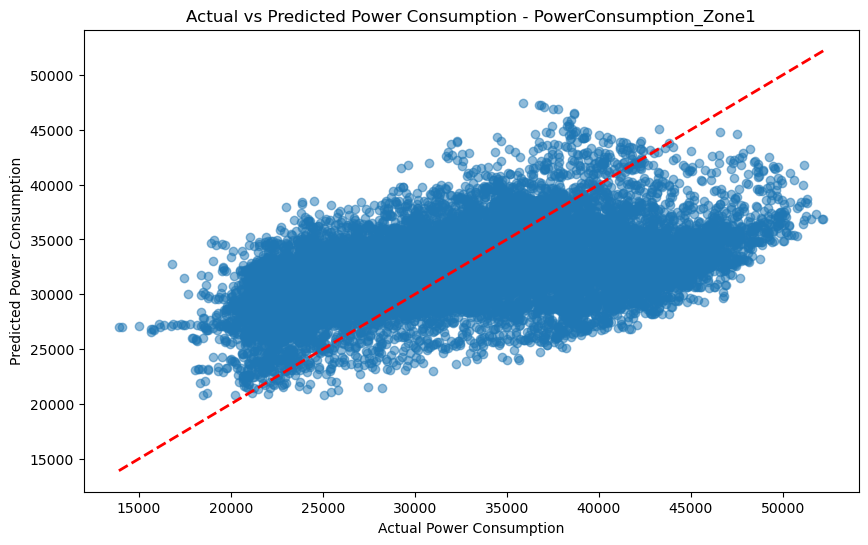


Results for PowerConsumption_Zone2:
Mean Squared Error: 20192479.63
R-squared Score: 0.25


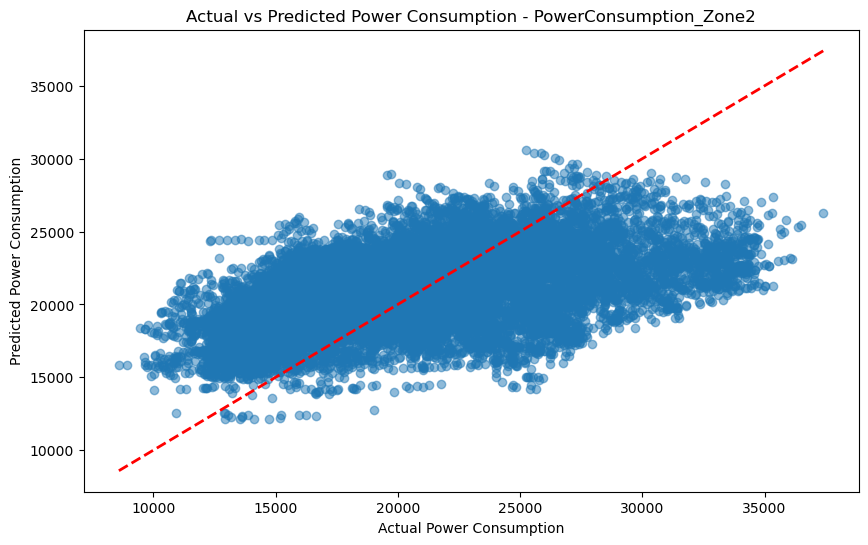


Results for PowerConsumption_Zone3:
Mean Squared Error: 23297958.83
R-squared Score: 0.47


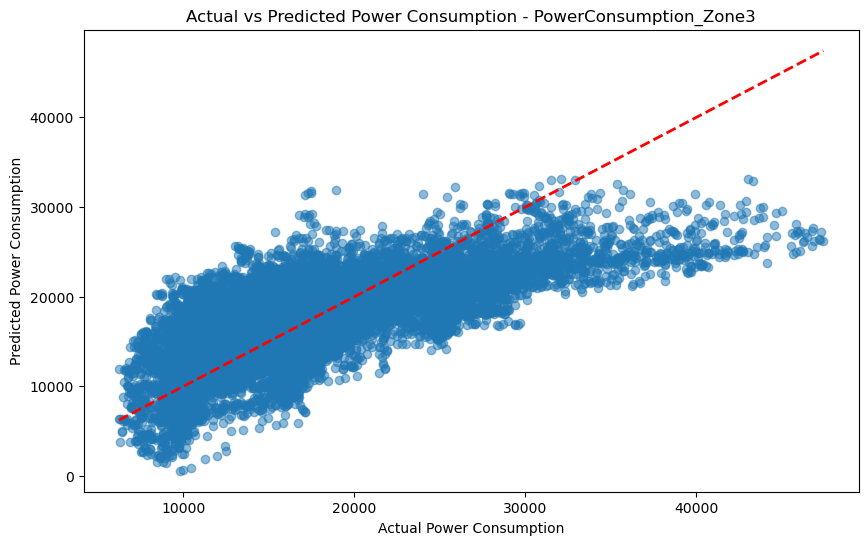

In [120]:
# Features and Target Variable

# Define features (X) and target variable (y)
# Remove non-numeric columns and target variables
X = df.drop(['Datetime', 'Time', 'Quarter', 'PowerConsumption_Zone1', 
             'PowerConsumption_Zone2', 'PowerConsumption_Zone3'], axis=1)
y = df[['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3']]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2025)

# Check the shape of the training and test sets
print("The shape of the training set is: ", X_train.shape, y_train.shape)
print("The shape of the testing set is: ", X_test.shape, y_test.shape)

# Create and fit separate models for each zone
models = {}
predictions = {}
metrics = {}

for zone in ['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3']:
    # Create model
    models[zone] = LinearRegression()
    
    # Fit model
    models[zone].fit(X_train, y_train[zone])
    
    # Make predictions
    predictions[zone] = models[zone].predict(X_test)
    
    # Calculate metrics
    mse = mean_squared_error(y_test[zone], predictions[zone])
    r2 = r2_score(y_test[zone], predictions[zone])
    
    metrics[zone] = {'MSE': mse, 'R2': r2}
    
    print(f"\nResults for {zone}:")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R-squared Score: {r2:.2f}")
    
    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test[zone], predictions[zone], alpha=0.5)
    plt.plot([y_test[zone].min(), y_test[zone].max()], 
             [y_test[zone].min(), y_test[zone].max()], 
             'r--', lw=2)
    plt.xlabel('Actual Power Consumption')
    plt.ylabel('Predicted Power Consumption') 
    plt.title(f'Actual vs Predicted Power Consumption - {zone}')
    plt.show()



Tuning models for PowerConsumption_Zone1:


e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.638e+11, tolerance: 1.487e+08
  model = cd_fast.enet_coordinate_descent(
e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.636e+11, tolerance: 1.490e+08
  model = cd_fast.enet_coordinate_descent(
e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.651e+11, tolerance: 1.491e

Best model for PowerConsumption_Zone1: Ridge
Best parameters: {'alpha': 1.0, 'fit_intercept': False}
Mean Squared Error: 39151590.08
R-squared Score: 0.23


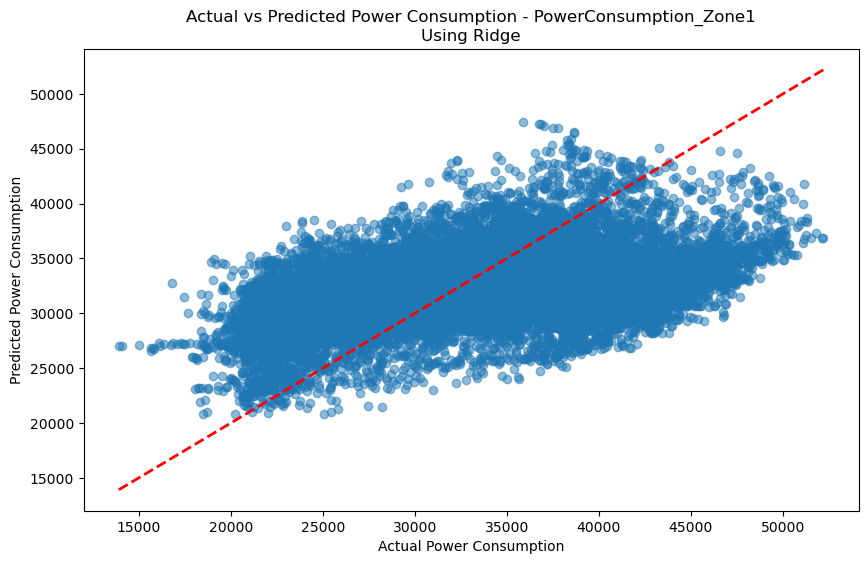


Tuning models for PowerConsumption_Zone2:


e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.902e+11, tolerance: 7.893e+07
  model = cd_fast.enet_coordinate_descent(
e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.916e+11, tolerance: 7.925e+07
  model = cd_fast.enet_coordinate_descent(
e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.930e+11, tolerance: 8.013e

Best model for PowerConsumption_Zone2: Ridge
Best parameters: {'alpha': 1.0, 'fit_intercept': False}
Mean Squared Error: 20192605.28
R-squared Score: 0.25


e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.649e+11, tolerance: 9.933e+07
  model = cd_fast.enet_coordinate_descent(


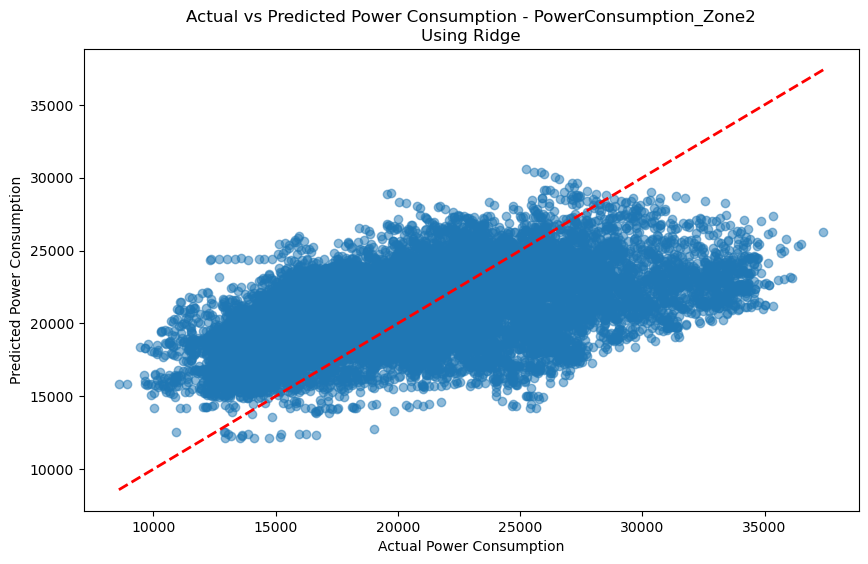


Tuning models for PowerConsumption_Zone3:


e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.318e+11, tolerance: 1.276e+08
  model = cd_fast.enet_coordinate_descent(
e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.354e+11, tolerance: 1.294e+08
  model = cd_fast.enet_coordinate_descent(
e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.348e+11, tolerance: 1.283e

Best model for PowerConsumption_Zone3: Ridge
Best parameters: {'alpha': 10.0, 'fit_intercept': False}
Mean Squared Error: 23297833.56
R-squared Score: 0.47


e:\Softwares\Anaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.175e+11, tolerance: 1.608e+08
  model = cd_fast.enet_coordinate_descent(


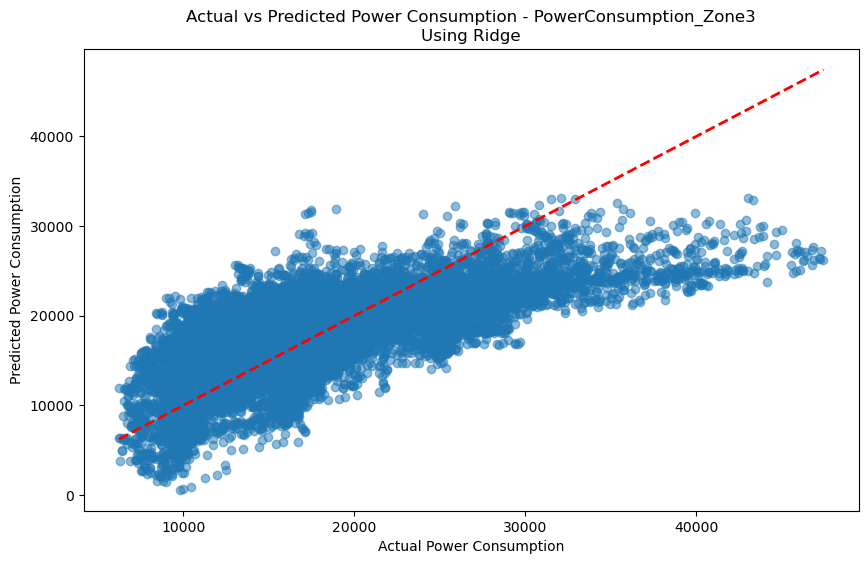

In [121]:
# Import required libraries for hyperparameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge, Lasso, ElasticNet

# Define parameter grids for different models
ridge_params = {
    'alpha': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
    'fit_intercept': [True, False]
}

lasso_params = {
    'alpha': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
    'fit_intercept': [True, False]
}

elastic_params = {
    'alpha': [0.001, 0.01, 0.1, 1.0, 10.0],
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9],
    'fit_intercept': [True, False]
}

# Dictionary to store best models
best_models = {}
best_predictions = {}
best_metrics = {}

for zone in ['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3']:
    print(f"\nTuning models for {zone}:")
    
    # Create and tune Ridge model
    ridge = GridSearchCV(Ridge(), ridge_params, cv=5, scoring='neg_mean_squared_error')
    ridge.fit(X_train, y_train[zone])
    
    # Create and tune Lasso model
    lasso = GridSearchCV(Lasso(), lasso_params, cv=5, scoring='neg_mean_squared_error')
    lasso.fit(X_train, y_train[zone])
    
    # Create and tune ElasticNet model
    elastic = GridSearchCV(ElasticNet(), elastic_params, cv=5, scoring='neg_mean_squared_error')
    elastic.fit(X_train, y_train[zone])
    
    # Compare models and select the best one
    models_dict = {
        'Ridge': ridge,
        'Lasso': lasso,
        'ElasticNet': elastic
    }
    
    best_score = float('-inf')
    best_model_name = None
    
    for model_name, model in models_dict.items():
        if model.best_score_ > best_score:
            best_score = model.best_score_
            best_model_name = model_name
    
    # Store best model
    best_models[zone] = models_dict[best_model_name]
    print(f"Best model for {zone}: {best_model_name}")
    print(f"Best parameters: {best_models[zone].best_params_}")
    
    # Make predictions with best model
    best_predictions[zone] = best_models[zone].predict(X_test)
    
    # Calculate metrics
    mse = mean_squared_error(y_test[zone], best_predictions[zone])
    r2 = r2_score(y_test[zone], best_predictions[zone])
    
    best_metrics[zone] = {'MSE': mse, 'R2': r2}
    
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R-squared Score: {r2:.2f}")
    
    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test[zone], best_predictions[zone], alpha=0.5)
    plt.plot([y_test[zone].min(), y_test[zone].max()], 
             [y_test[zone].min(), y_test[zone].max()], 
             'r--', lw=2)
    plt.xlabel('Actual Power Consumption')
    plt.ylabel('Predicted Power Consumption')
    plt.title(f'Actual vs Predicted Power Consumption - {zone}\nUsing {best_model_name}')
    plt.show()


In [122]:
# Print metrics for all zones
print("\nModel Performance Metrics:")
print("-" * 50)
for zone in best_metrics:
    print(f"\n{zone}:")
    print(f"Mean Squared Error: {best_metrics[zone]['MSE']:.2f}")
    print(f"R-squared Score: {best_metrics[zone]['R2']:.2f}")



Model Performance Metrics:
--------------------------------------------------

PowerConsumption_Zone1:
Mean Squared Error: 39151590.08
R-squared Score: 0.23

PowerConsumption_Zone2:
Mean Squared Error: 20192605.28
R-squared Score: 0.25

PowerConsumption_Zone3:
Mean Squared Error: 23297833.56
R-squared Score: 0.47
